## Final Project Data 620 Summmer 2025

### Team: Ahm Hamza



## Overview

This project investigates how conversational power and discursive dynamics are structured within and across various Reddit communities. Grounded in the broader research question of how dominant or marginalized users, themes, and rhetorical styles emerge within different online social spaces, the analysis focuses on reply networks, sentiment expression, and community structure. By constructing user interaction graphs based on comment threads and applying network centrality and community detection algorithms, the project examines which users hold influence within each subreddit and how their emotional tone and thematic engagement relate to their position in the social graph. Through a multi-layered analysis that integrates text processing, sentiment analysis, topic modeling, and network metrics such as PageRank, degree centralization, and modularity, the study reveals distinct patterns of power distribution, emotional polarization, and thematic clustering across subreddits. Visualizations and statistical comparisons are used to assess how centralized or egalitarian each community is, how sentiment varies across themes and users, and how the structural architecture of online discourse reflects broader dynamics of privilege, marginalization, and influence.










In [ ]:
!pip install -q praw


In [36]:
# core libraries
import pandas as pd
import numpy as np
import logging
import warnings
from collections import defaultdict, Counter

# progress bar
from tqdm import tqdm

# network analysis
import networkx as nx
import community as community_louvain  # Louvain community detection

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from wordcloud import WordCloud

# text processing
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize # Import sent_tokenize
from nltk.stem.wordnet import WordNetLemmatizer

# text analysis & feature extraction
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from textblob import TextBlob

# evaluation metrics
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

# suppress logging from PRAW or other verbose modules
logging.getLogger("praw").setLevel(logging.ERROR)

# download required nltk data
nltk.download('vader_lexicon')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')  # Open Multilingual Wordnet
nltk.download('averaged_perceptron_tagger')  # POS tagger
nltk.download('maxent_ne_chunker')           # Named Entity Chunker
nltk.download('words')                       # English word list
nltk.download('punkt_tab') # Download the missing resource

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   

True

## Data Collection and Scraping
To collect data for this project, Reddit's official API was accessed using the Python Reddit API Wrapper (PRAW), authenticated through a registered script-based application. The scraping targeted 50 diverse subreddits spanning themes such as social judgment (r/AmItheAsshole, r/unpopularopinion), relationships and gender (r/relationships, r/MensRights, r/Feminism), mental health (r/depression, r/ADHD), political discourse (r/politics, r/Conservative), and philosophical debate (r/changemyview, r/philosophy). For each subreddit, the most popular 50 posts were scraped using the .hot() method to ensure a consistent sample of highly visible discourse. For each post, metadata such as title, author, score, judgment tags and number of comments were recorded. A custom extract_judgment() function was used to extract conflict-oriented labels from post titles. All top-level and nested comments were retrieved recursively by flattening the comment threads, capturing author IDs, comment scores, depth, and parent-child relationships. Each comment and post was cleaned using a pipeline that removed punctuation, links, and stopwords, while applying lemmatization for downstream text analysis. The final dataset was structured into two relational DataFrames: df_posts, containing metadata and cleaned text for each submission, and df_comments, recording all associated comment threads. This structure enabled a robust integration of textual and network-based analysis, allowing the project to trace patterns of interaction, influence, and discourse within and across online communities.

In [ ]:

# initialize reddit api connection
reddit = praw.Reddit(
    client_id="hyyIqZRK0b0FJA98WveTxQ",
    client_secret="mlzG_7NLvcgmmc2SfURVPnJ9dkgvWw",
    user_agent="windows:reddit.textclassifier:v1.0 (by /u/kab971jam3)"
)


target_subreddits = [
    # Social norms, morality, and judgment
    "AmItheAsshole", "TrueOffMyChest", "confessions", "unpopularopinion",

    # Relationships, identity, and gender
    "relationships", "relationship_advice", "TwoXChromosomes", "AskMen", "AskWomen",
    "MensRights", "Feminism", "exmormon", "exchristian",

    # Mental health and emotion
    "depression", "socialskills", "mentalhealth", "ADHD", "DecidingToBeBetter",

    # Politics and ideology
    "politics", "Conservative", "LateStageCapitalism", "Libertarian", "PoliticalDiscussion",

    # Moral reasoning and debate
    "changemyview", "philosophy", "askphilosophy", "askscience", "NoStupidQuestions",

    # Economic struggles and class
    "povertyfinance", "antiwork", "PersonalFinance", "financialindependence", "WorkReform",

    # Parenting and youth/adult divide
    "Parenting", "Childfree", "teenagers", "teachers",

    # Tech, AI, digital control
    "technology", "Futurology", "ArtificialInteligence", "Privacy", "SocialMedia",

    # Culture and lifestyle
    "AskReddit", "LifeProTips", "CasualConversation", "todayilearned", "Frugal"


]


def clean_text(text):
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'\[.*?\]\(.*?\)', '', text)  # remove markdown links
    text = re.sub(r'[^\w\s]', '', text)  # remove punctuation
    tokens = word_tokenize(text.lower())
    tokens = [w for w in tokens if w not in stopwords.words('english')]
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(w) for w in tokens]
    return " ".join(tokens)

def extract_judgment(text):
    """Extract judgment tags from post flair or title"""
    if not isinstance(text, str):
        return None
    text = text.upper()
    if 'YTA' in text:
        return 'YTA'
    elif 'NTA' in text:
        return 'NTA'
    elif 'ESH' in text:
        return 'ESH'
    elif 'NAH' in text:
        return 'NAH'
    return None

def scrape_subreddit(subreddit_name, limit=100):
    subreddit = reddit.subreddit(subreddit_name)
    data = []

    for submission in subreddit.hot(limit=limit):
        submission.comments.replace_more(limit=0)
        comments = submission.comments.list()

        post_data = {
            "subreddit": subreddit_name,
            "post_id": submission.id,
            "title": submission.title,
            "author": str(submission.author),
            "post_text": submission.selftext,
            "post_score": submission.score,
            "num_comments": submission.num_comments,
            "judgment": extract_judgment(submission.title),
            "url": submission.url,
            "comments": [],
        }

        for comment in comments:
            post_data["comments"].append({
                "comment_id": comment.id,
                "parent_id": comment.parent_id,
                "author": str(comment.author),
                "body": comment.body,
                "score": comment.score,
                "depth": comment.depth
            })

        data.append(post_data)

    return data

all_data = []

for sub in target_subreddits:
    print(f"Scraping r/{sub}...")
    try:
        sub_data = scrape_subreddit(sub, limit=50)
        all_data.extend(sub_data)
    except Exception as e:
        print(f"Failed to scrape {sub}: {e}")

# Flatten for posts
posts = []
comments = []

for item in all_data:
    clean_post_text = clean_text(item["title"] + " " + item["post_text"])
    posts.append({
        "subreddit": item["subreddit"],
        "post_id": item["post_id"],
        "author": item["author"],
        "title": item["title"],
        "clean_text": clean_post_text,
        "judgment": item["judgment"],
        "score": item["post_score"],
        "num_comments": item["num_comments"],
        "url": item["url"]
    })

    for c in item["comments"]:
        comments.append({
            "post_id": item["post_id"],
            "comment_id": c["comment_id"],
            "parent_id": c["parent_id"],
            "author": c["author"],
            "body": clean_text(c["body"]),
            "score": c["score"],
            "depth": c["depth"]
        })

df_posts = pd.DataFrame(posts)
df_comments = pd.DataFrame(comments)


In [ ]:
# #saving the data
# df_posts.to_csv("reddit_posts_cleaned.csv", index=False)
# df_comments.to_csv("reddit_comments_cleaned.csv", index=False)


In [325]:
# # Merge subreddit info from posts into comments using 'post_id'
# df_comments = df_comments.merge(df_posts[['post_id', 'subreddit']], on='post_id', how='left')






# # Save updated comments file
# df_comments.to_csv("reddit_comments_N_cleaned.csv", index=False)

# print(df_comments.columns)
# print(df_comments['subreddit'].unique()[:10])


## Loding the data from here because scraping is done!

In [3]:
df_posts = pd.read_csv("reddit_posts_cleaned.csv")
df_posts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2250 entries, 0 to 2249
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   subreddit     2250 non-null   object
 1   post_id       2250 non-null   object
 2   author        2242 non-null   object
 3   title         2250 non-null   object
 4   clean_text    2248 non-null   object
 5   judgment      55 non-null     object
 6   score         2250 non-null   int64 
 7   num_comments  2250 non-null   int64 
 8   url           2250 non-null   object
dtypes: int64(2), object(7)
memory usage: 158.3+ KB


In [4]:
df_comments = pd.read_csv("reddit_comments_cleaned.csv", on_bad_lines='skip', encoding='utf-8')
df_comments.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142514 entries, 0 to 142513
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   post_id     142514 non-null  object
 1   comment_id  142514 non-null  object
 2   parent_id   142514 non-null  object
 3   author      140406 non-null  object
 4   body        141346 non-null  object
 5   score       142514 non-null  int64 
 6   depth       142514 non-null  int64 
 7   subreddit   142514 non-null  object
dtypes: int64(2), object(6)
memory usage: 8.7+ MB


In [5]:
print(df_comments.columns)
print(df_comments['subreddit'].unique()[:10])

Index(['post_id', 'comment_id', 'parent_id', 'author', 'body', 'score',
       'depth', 'subreddit'],
      dtype='object')
['AmItheAsshole' 'TrueOffMyChest' 'confessions' 'unpopularopinion'
 'relationships' 'relationship_advice' 'TwoXChromosomes' 'AskMen'
 'AskWomen' 'MensRights']


### Comments and Graph
In this code, I create a directed graph to show how users interact in the comments section of Reddit posts. First, I make a dictionary called `comment_author_dict` that lets me quickly find the author of any comment using its `comment_id`. This is done by setting the "comment_id" as the index of the `df_comments` DataFrame and converting the "author" column into a dictionary. Then, I initialize an empty directed graph `G` using the `networkx` library.

Next, I loop through each comment in the `df_comments` DataFrame, using `tqdm` to display a progress bar. For each comment, I check if it's a reply (depth > 0), if its `parent_id` is a string, and if it starts with "t1_" (indicating a comment parent). If these conditions are met, I get the parent comment ID and look up the parent author's name using `comment_author_dict`. If both the parent author and the current comment's author exist, I add an edge from the current author's node to the parent author's node in the graph `G`, representing a reply. Finally, I print the total number of unique authors (nodes) and the number of reply relationships (edges) in the graph.

In [6]:

# create fast lookup dictionary of comment_id and author
comment_author_dict = df_comments.set_index("comment_id")["author"].to_dict()

# initialize directed graph
G = nx.DiGraph()

# iterate efficiently with tqdm
for _, row in tqdm(df_comments.iterrows(), total=len(df_comments)):
    if row['depth'] > 0 and isinstance(row["parent_id"], str) and "t1_" in row["parent_id"]:
        parent_comment_id = row["parent_id"].split("_")[1]
        parent_author = comment_author_dict.get(parent_comment_id)
        if parent_author and row["author"]:
            G.add_edge(row["author"], parent_author, weight=1)

print("Nodes:", G.number_of_nodes())
print("Edges:", G.number_of_edges())




100%|██████████| 142514/142514 [00:11<00:00, 11975.59it/s]

Nodes: 45781
Edges: 67954


#### Network Analysis Metrics for Top Authors


Codes calculates several network analysis metrics for the top 2000 authors based on their comment count. First, it identifies the top authors by getting the value counts of the 'author' column in the `df_comments` DataFrame and selecting the index of the top 2000 entries. Then, it creates a subgraph `G_sub` from the original graph `G` containing only these top authors and their interactions. The code then computes five centrality measures on this subgraph: Degree Centrality (which measures the number of direct connections a node has), PageRank (an algorithm used by Google to rank web pages, adapted here to assess influence), Betweenness Centrality (which quantifies how often a node lies on the shortest path between other nodes), Closeness Centrality (measuring how close a node is to all other nodes in the network), and Eigenvector Centrality (which indicates a node's influence based on the influence of its neighbors). Finally, it compiles these metrics, along with the simple degree of each node in the subgraph, into a list of dictionaries called `metrics`, preparing the data for further analysis or visualization of author influence and connectivity within the comment section network of the top commenters.


In [7]:
# top authors by comment count
top_authors = df_comments['author'].value_counts().head(2000).index
G_sub = G.subgraph(top_authors).copy()

# safely runing centralities
deg_centrality = nx.degree_centrality(G_sub)
page_rank = nx.pagerank(G_sub)
betweenness = nx.betweenness_centrality(G_sub)
closeness = nx.closeness_centrality(G_sub)
eigen = nx.eigenvector_centrality(G_sub, max_iter=500, tol=1e-06)

centralities = {
    "Degree Centrality": nx.degree_centrality(G_sub),
    "Betweenness Centrality": nx.betweenness_centrality(G_sub),
    "Closeness Centrality": nx.closeness_centrality(G_sub),
    "Eigenvector Centrality": nx.eigenvector_centrality(G_sub),
    "PageRank": nx.pagerank(G_sub)
}

metrics = []
for node in G_sub.nodes(): # Use G_sub.nodes() as centralities are calculated on G_sub
    metrics.append({
        'node': node,
        'degree': G_sub.degree[node], # Use G_sub.degree
        'degree_centrality': deg_centrality[node],
        'betweenness': betweenness[node],
        'closeness': closeness[node],
        'eigenvector': eigen[node],
        'pagerank': page_rank[node]
    })


#### Evaluating Top Authors by Centrality Metrics
This block of codes takes the `metrics` list, which contains network centrality scores for the top authors in the comment interaction graph, and identifies the top 50 authors based on each of the calculated centrality measures: degree, degree centrality, betweenness centrality, closeness centrality, eigenvector centrality, and PageRank. For each centrality type, it sorts the `metrics` list in descending order based on that specific centrality's value and then selects the top 50 entries. Finally, it prints the results for each category, showing the author's node identifier along with their specific centrality score, allowing for a quick comparison and identification of authors who are most prominent, influential, or central within the network according to different network properties.


In [8]:
# running the basic eval on top by centralities
top_by_degree = sorted(metrics, key=lambda x: x['degree'], reverse=True)[:50]
top_by_degree_centrality = sorted(metrics, key=lambda x: x['degree_centrality'], reverse=True)[:50]
top_by_betweenness = sorted(metrics, key=lambda x: x['betweenness'], reverse=True)[:50]
top_by_closeness = sorted(metrics, key=lambda x: x['closeness'], reverse=True)[:50]
top_by_eigenvector = sorted(metrics, key=lambda x: x['eigenvector'], reverse=True)[:50]
top_by_pagerank = sorted(metrics, key=lambda x: x['pagerank'], reverse=True)[:50]

# print results
print("Top 50 nodes by degree:")
for m in top_by_degree:
    print(f"Node {m['node']}: degree={m['degree']}, degree_centrality={m['degree_centrality']:.2f}, "
          f"betweenness={m['betweenness']:.2f}, closeness={m['closeness']:.2f}, "
          f"eigenvector={m['eigenvector']:.2f}, pagerank={m['pagerank']:.2f}")

print("\nTop 50 nodes by degree centrality:")
for m in top_by_degree_centrality:
    print(f"Node {m['node']}: degree_centrality={m['degree_centrality']:.2f}")

print("\nTop 50 nodes by betweenness:")
for m in top_by_betweenness:
    print(f"Node {m['node']}: betweenness={m['betweenness']:.2f}")

print("\nTop 50 nodes by closeness:")
for m in top_by_closeness:
    print(f"Node {m['node']}: closeness={m['closeness']:.2f}")

print("\nTop 50 nodes by eigenvector:")
for m in top_by_eigenvector:
    print(f"Node {m['node']}: eigenvector={m['eigenvector']:.2f}")

print("\nTop 50 nodes by pagerank:")
for m in top_by_pagerank:
    print(f"Node {m['node']}: pagerank={m['pagerank']:.2f}")

Top 50 nodes by degree:
Node listen2yourcat: degree=84, degree_centrality=0.04, betweenness=0.00, closeness=0.04, eigenvector=0.33, pagerank=0.00
Node SolomonGrumpy: degree=83, degree_centrality=0.04, betweenness=0.03, closeness=0.05, eigenvector=0.15, pagerank=0.00
Node YampaValleyCurse: degree=54, degree_centrality=0.03, betweenness=0.00, closeness=0.04, eigenvector=0.21, pagerank=0.00
Node bl1y: degree=53, degree_centrality=0.03, betweenness=0.02, closeness=0.07, eigenvector=0.00, pagerank=0.00
Node Dunder-MifflinPaper: degree=52, degree_centrality=0.03, betweenness=0.00, closeness=0.04, eigenvector=0.26, pagerank=0.00
Node ClockOfTheLongNow: degree=50, degree_centrality=0.03, betweenness=0.05, closeness=0.07, eigenvector=0.00, pagerank=0.00
Node Turbulent_Tale6497: degree=44, degree_centrality=0.02, betweenness=0.00, closeness=0.04, eigenvector=0.19, pagerank=0.00
Node AdmiralPeriwinkle: degree=42, degree_centrality=0.02, betweenness=0.00, closeness=0.04, eigenvector=0.13, pagerank

  This hairball graph representing the network structure,
  highlighting key nodes based on a provided list. a hairball graph,
  also known as a force-directed graph, attempts to position nodes in a way
  that minimizes edge crossings and places connected nodes closer together.
  This method is often used to visualize dense, complex networks where
  individual connections are less important than the overall structure and
  the positions of highly connected or central nodes. the 'spring_layout'
  algorithm simulates a physical system where nodes are charged particles
  repelling each other and edges are springs attracting nodes, leading to an
  equilibrium state that reveals clustering and central nodes.

  This function takes a networkx graph object `G`, a list of `top_nodes`
  to be highlighted, and a `title` for the plot. it uses matplotlib for
  rendering. the nodes are drawn with varying sizes and colors based on
  their degree centrality to visually emphasize more connected nodes,
  particularly the highlighted 'top_nodes'. the edges are drawn with high
  transparency to prevent visual clutter while still showing the network
  density. labels are only added for the 'top_nodes' to maintain readability
  in a dense graph. the layout is configured to spread nodes out more
  for better visibility.

  parameters:
      g (networkx.graph): the graph to visualize.
      top_nodes (list): a list of node identifiers to highlight in the graph.
      title (str): the title for the plot.

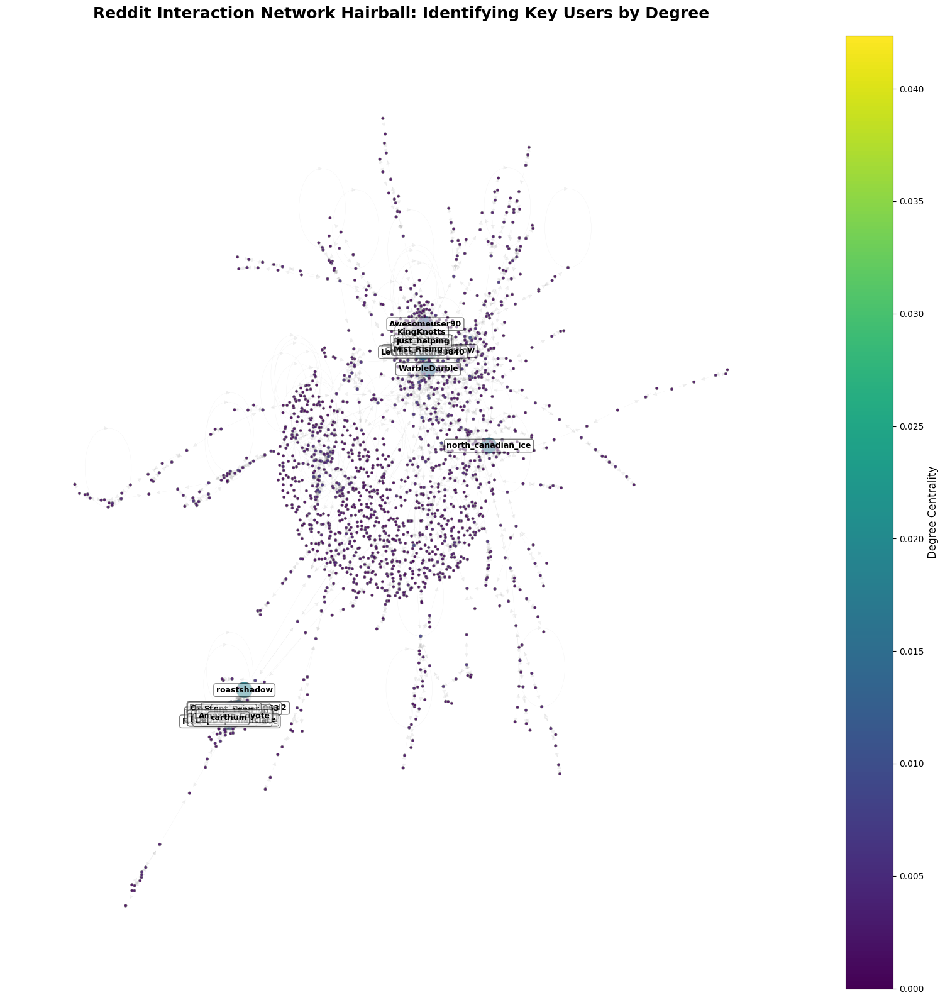

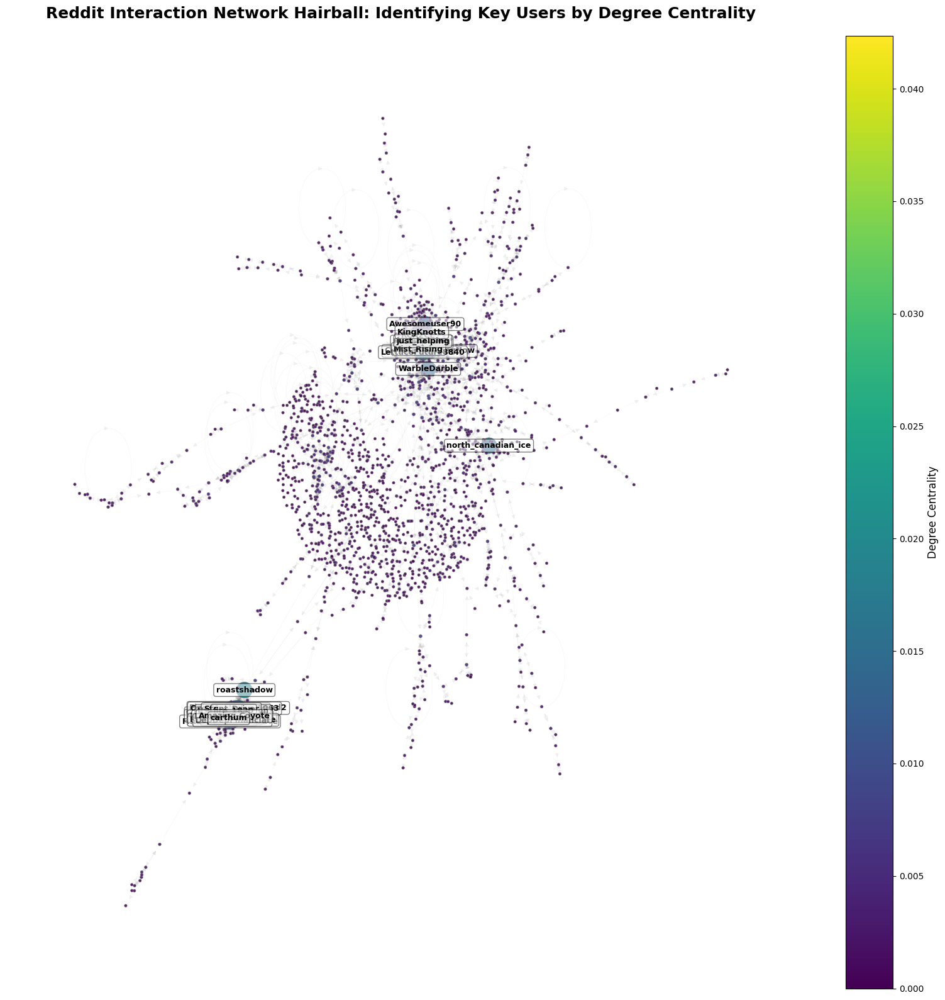

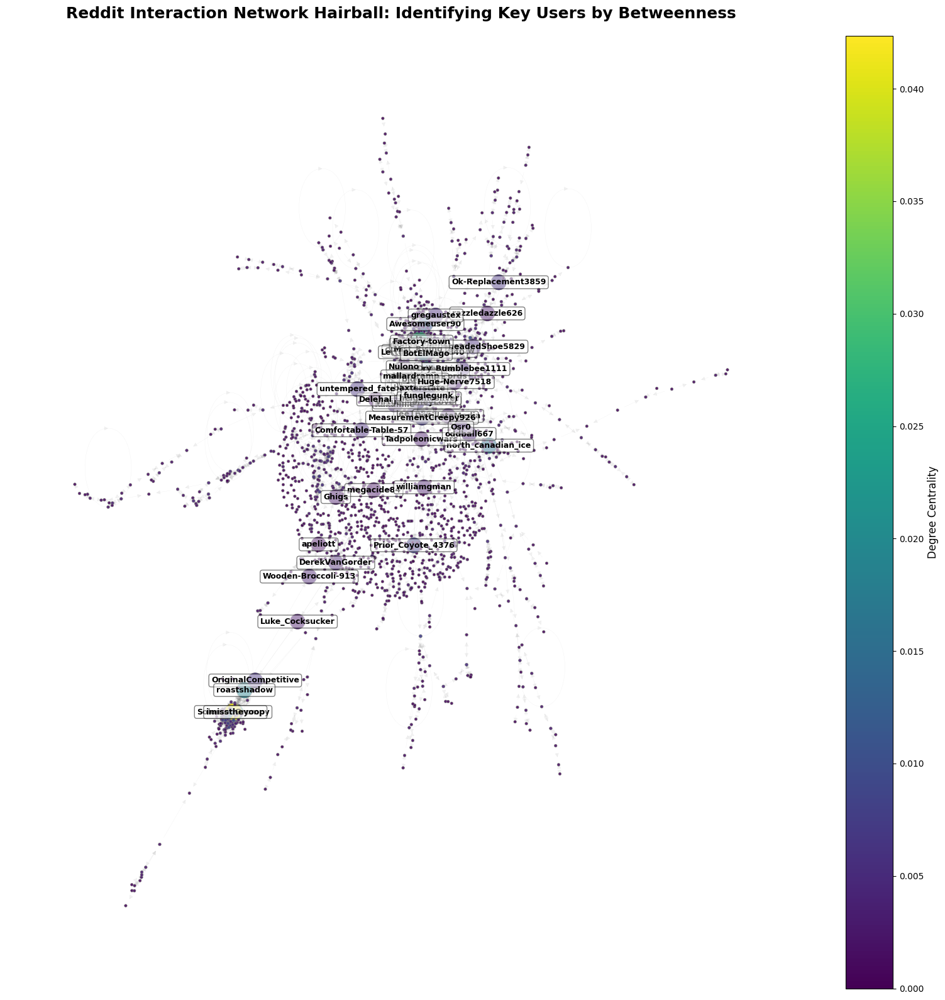

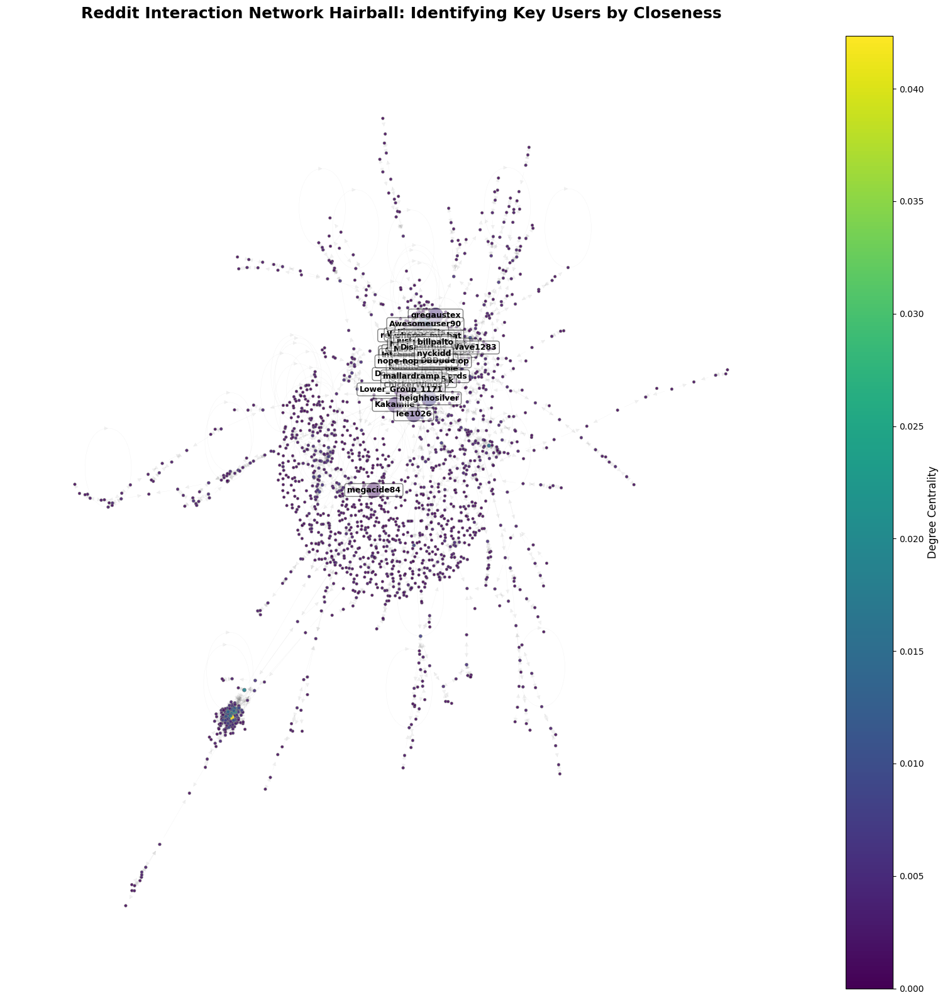

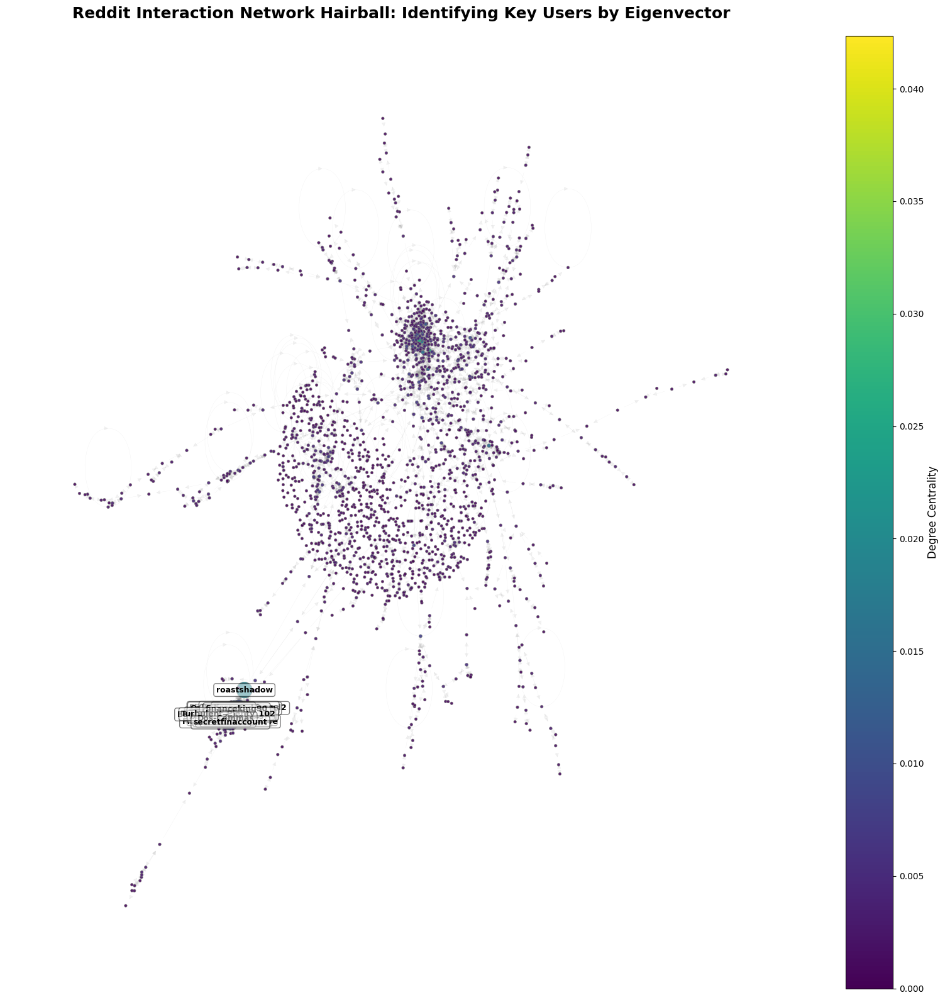

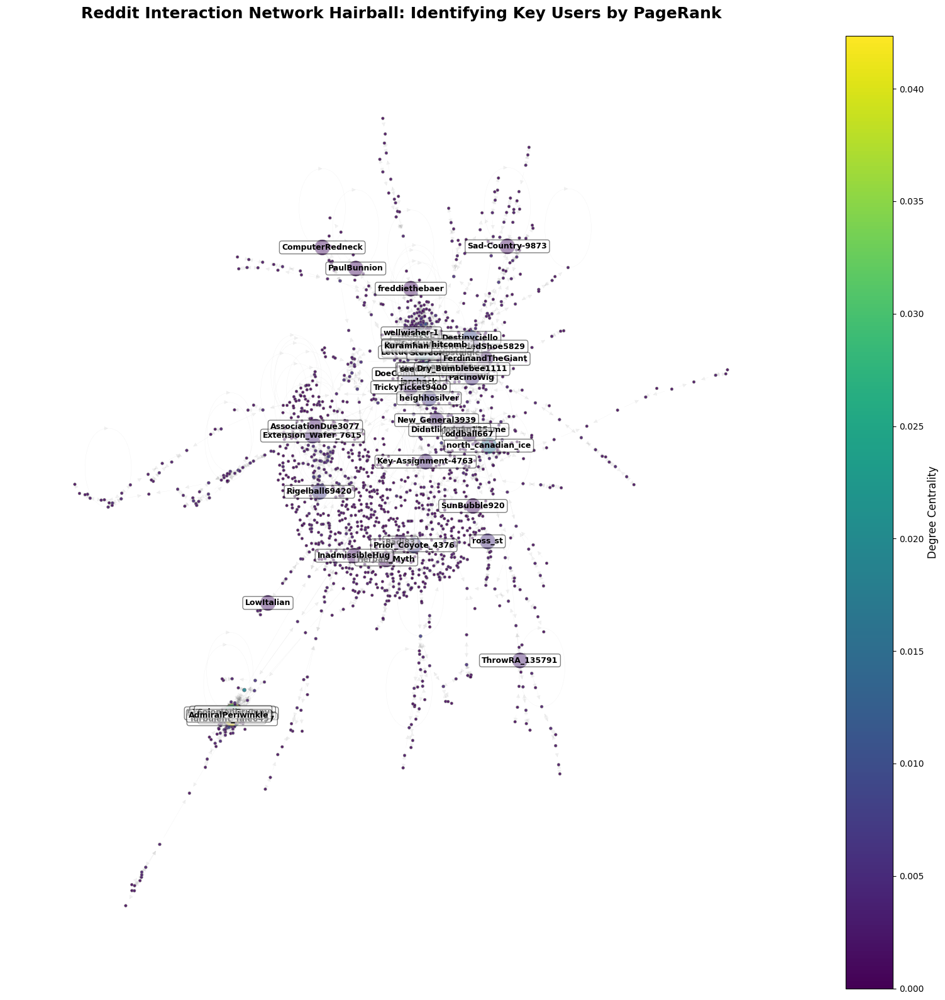

In [9]:

def draw_hairball_graph(G, top_nodes, title):
  plt.figure(figsize=(16, 16)) # increase figure size for better visibility
  # use fruchterman-reingold layout for a different 'hairball' aesthetic
  pos = nx.fruchterman_reingold_layout(G, seed=42, k=0.1, iterations=100) # adjusted k and iterations for density

  # compute degree centrality for node size and color
  centrality = nx.degree_centrality(G)
  node_sizes = [
      300 + centrality.get(node, 0) * 2000 if node in top_nodes else 10 + centrality.get(node, 0) * 500
      for node in G.nodes()
  ]
  node_colors = [centrality.get(node, 0.01) for node in G.nodes()]

  # draw nodes with enhanced styling
  nodes = nx.draw_networkx_nodes(
      G, pos,
      node_size=node_sizes,
      node_color=node_colors,
      cmap='viridis', # use a different colormap
      alpha=0.9,
      linewidths=0.5,
      edgecolors='black'
  )
  nodes.set_edgecolor('gray') # set node border color

  # draw edges with higher transparency and maybe thinner lines
  nx.draw_networkx_edges(G, pos, alpha=0.1, width=0.3, edge_color='gray') # thinner, more transparent edges

  # add labels only for top nodes with adjusted font size
  labels = {node: node for node in top_nodes}
  nx.draw_networkx_labels(
      G, pos,
      labels=labels,
      font_size=9, # slightly larger font for labels
      font_color='black',
      font_weight='bold',
      bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.5) # add background to labels
  )

  # add a more descriptive and fashionable title
  plt.title(f'Reddit Interaction Network Hairball: Identifying Key Users by {title.split("by ")[-1]}', fontsize=18, fontweight='bold', pad=20) # more descriptive title

  # add a colorbar to show what node color represents
  sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
  sm.set_array([]) # needed for the colorbar
  cbar = plt.colorbar(sm, ax=plt.gca())
  cbar.set_label('Degree Centrality', fontsize=12)

  plt.axis('off')
  plt.tight_layout() # adjust layout to prevent overlapping elements
  plt.show()

draw_hairball_graph(G_sub, [m['node'] for m in top_by_degree], "Hairball Graph - Top 50 by Degree")
draw_hairball_graph(G_sub, [m['node'] for m in top_by_degree_centrality], "Hairball Graph - Top 50 by Degree Centrality")
draw_hairball_graph(G_sub, [m['node'] for m in top_by_betweenness], "Hairball Graph - Top 50 by Betweenness")
draw_hairball_graph(G_sub, [m['node'] for m in top_by_closeness], "Hairball Graph - Top 50 by Closeness")
draw_hairball_graph(G_sub, [m['node'] for m in top_by_eigenvector], "Hairball Graph - Top 50 by Eigenvector")
draw_hairball_graph(G_sub, [m['node'] for m in top_by_pagerank], "Hairball Graph - Top 50 by PageRank")

#### Narrow focus on designated subreddit


The code df_posts = df_posts[df_posts["subreddit"].isin(focus_subs)] and df_comments = df_comments[df_comments["subreddit"].isin(focus_subs)] filters the posts and comments DataFrames to include only those from a specific list of "focus subreddits" stored in focus_subs. This helps reduce the dataset size for faster processing.

After filtering, a new column, 'parent_author', is added to the df_comments DataFrame. A function checks if the 'parent_id' indicates a reply to another comment (starting with 't1_'). If it does, the function extracts the parent comment ID and looks up the parent author using a previously created dictionary. If the parent ID is not valid or the author can't be found, 'parent_author' is set to None. This step helps track comment interactions by identifying who each comment is replying to.





In [10]:


# limit to top focus subreddits for speed
focus_subs = ["AmItheAsshole", "Feminism", "MensRights", "relationships", "politics", "Conservative",
              "Libertarian"]
df_posts = df_posts[df_posts["subreddit"].isin(focus_subs)]
df_comments = df_comments[df_comments["subreddit"].isin(focus_subs)]

# create parent_author column from comment thread data
comment_authors = df_comments.set_index('comment_id')['author'].to_dict()
df_comments['parent_author'] = df_comments['parent_id'].apply(
    lambda pid: comment_authors.get(pid.split('_')[1], None) if 't1_' in pid else None
)


####  Analyzing Social Graphs from Reddit Comments

This code section focuses on building and analyzing social interaction networks based on user replies within Reddit comment sections. Building Graphs build_graphs: This method processes unique subreddits from the `df_posts` DataFrame, creating a directed graph (`nx.DiGraph()`). It adds unique authors from posts as nodes (excluding '[deleted]') and checks the validity of comment authors and their parent authors to add directed edges representing replies. It ensures each graph has at least 20 nodes before storing it in `self.graphs`, and prints progress messages throughout the process.

**Computing Centrality Metrics (`compute_metrics`)**: This method goes through each graph in `self.graphs`, creating an undirected version for certain centrality measures. It calculates metrics like `degree`, `in_degree`, `out_degree`, `closeness`, and `pagerank`, storing them in a nested dictionary indexed by subreddit name. Progress messages are printed when metrics calculation begins.

**Visualizing Subreddit Network (`visualize_subreddit_network`)**: This method takes a `subreddit_name`, retrieves the corresponding graph from `self.graphs`, and sets up a matplotlib figure. It computes node positions using the `nx.spring_layout` algorithm and draws the graph without labels to reduce clutter, using small nodes and semi-transparent edges. The plot is titled with the subreddit name and displayed. If the graph isn’t found, a message indicates its absence.

In [11]:
# social graph
class SubredditNetworkAnalyzer:
    def __init__(self, df_posts, df_comments):
        self.df_posts = df_posts
        self.df_comments = df_comments
        self.graphs = {}
        self.metrics = {}

    def build_graphs(self):
        print("building subreddit reply networks...")
        for sub in self.df_posts['subreddit'].unique():
            posts = self.df_posts[self.df_posts['subreddit'] == sub]
            comments = self.df_comments[self.df_comments['subreddit'] == sub]
            G = nx.DiGraph()
            for a in posts['author'].dropna().unique():
                if a != '[deleted]':
                    G.add_node(a)
            for _, row in comments.iterrows():
                a, p = row['author'], row['parent_author']
                if all([pd.notna(a), pd.notna(p), a != '[deleted]', p != '[deleted]']):
                    G.add_edge(a, p)
            if G.number_of_nodes() >= 20:
                self.graphs[sub] = G
        print(f"created {len(self.graphs)} subreddit graphs")

    def compute_metrics(self):
        print("computing centrality metrics...")
        for sub, G in self.graphs.items():
            Gu = G.to_undirected()
            self.metrics[sub] = {
                'degree': nx.degree_centrality(Gu),
                'in_degree': nx.in_degree_centrality(G),
                'out_degree': nx.out_degree_centrality(G),
                'closeness': nx.closeness_centrality(Gu),
                'pagerank': nx.pagerank(G)
            }

    def visualize_subreddit_network(self, subreddit_name):
        if subreddit_name in self.graphs:
            G = self.graphs[subreddit_name]
            plt.figure(figsize=(12, 12))
            pos = nx.spring_layout(G, k=0.15, iterations=20)  # Adjust k and iterations for better layout
            nx.draw(G, pos, with_labels=False, node_size=20, width=0.2, edge_color='gray', alpha=0.6)
            plt.title(f"Network for r/{subreddit_name}")
            plt.show()
        else:
            print(f"Network for r/{subreddit_name} not found.")

## The CommunityDetector
Class is designed to find communities within the subreddit interaction networks that were previously built. It uses the Louvain method, a popular algorithm for community detection in graphs. The ‘detect’ method iterates through each undirected graph representing a subreddit's reply network. For each graph, it applies the Louvain algorithm to partition the nodes (users) into communities. It then stores the community assignments for each node, the list of nodes within each community, the modularity score (which measures the strength of the community structure), and the total count of detected communities for each subreddit.

In [12]:
# power clusters and sun-network
import community as community_louvain
from collections import defaultdict

class CommunityDetector:
    def __init__(self, graphs):
        self.graphs = graphs
        self.communities = {}

    def detect(self):
        print("detecting communities...")
        for sub, G in self.graphs.items():
            Gu = G.to_undirected()
            part = community_louvain.best_partition(Gu)
            comms = defaultdict(list)
            for node, cid in part.items():
                comms[cid].append(node)
            self.communities[sub] = {
                'partition': part,
                'communities': dict(comms),
                'modularity': community_louvain.modularity(part, Gu),
                'count': len(comms)
            }

#### Privilege Eval Metrics

The PrivilegeAnalyzer class examines whether a user's structural power within the comment-reply network is predictive of the social value assigned to their speech, as measured by upvote scores. It uses a comments dataframe (df_comments) and a dictionary of centrality metrics (metrics).
The core functionality is within the `analyze` method. This method iterates through each unique subreddit present in the comments data. For each subreddit, it first groups the comments by author and calculates the mean, sum, and count of comment scores for each author. It then filters these scores to include only authors who are also present in the network metrics (specifically, those with a calculated PageRank). PageRank captures both direct and indirect influence in a directed network, while Degree Centrality reflects immediate conversational engagement. Finally, it computes the Pearson correlation coefficient between the authors' PageRank and their average comment score, and similarly for their Degree Centrality and average comment score. This correlation indicates the extent to which network influence is associated with positive (or negative) reception of comments. The results, including these correlation coefficients and a list of the top 10 authors by PageRank, are stored and returned in a dictionary, providing insights into whose contributions are most valued (or privileged) based on their network position.

In [13]:
# silencing & privilege
class PrivilegeAnalyzer:
    def __init__(self, df_comments, metrics):
        self.df_comments = df_comments
        self.metrics = metrics

    def analyze(self):
        print("correlating score vs centrality...")
        results = {}
        for sub in self.df_comments['subreddit'].unique():
            comm = self.df_comments[self.df_comments['subreddit'] == sub]
            scores = comm.groupby('author')['score'].agg(['mean', 'sum', 'count']).reset_index()
            scores = scores[scores['author'].isin(self.metrics[sub]['pagerank'])]
            scores['pagerank'] = scores['author'].map(self.metrics[sub]['pagerank'])
            scores['degree'] = scores['author'].map(self.metrics[sub]['degree'])
            corr = {
                'pagerank_avg_score': scores['pagerank'].corr(scores['mean']),
                'degree_avg_score': scores['degree'].corr(scores['mean'])
            }
            results[sub] = {'correlations': corr, 'top': scores.sort_values('pagerank', ascending=False).head(10)}
        return results


The `ThematicAnalyzer` class is designed to uncover the main discussion themes within the cleaned comments of different subreddits using Latent Dirichlet Allocation (LDA), a popular topic modeling technique. The class initializes with a DataFrame of cleaned comments (`df_comments`). Its main function, `lda_topics`, performs the topic modeling for a specified subreddit. It first filters the comments DataFrame to include only comments from the target subreddit, ensuring the comments are long enough (over 20 characters) and not empty. If there aren't enough valid comments, it skips the process for that subreddit. It then uses `TfidfVectorizer` to convert the text data into numerical features (TF-IDF scores), selecting the top 500 most important words while removing common English stopwords and words that appear too frequently or infrequently. Finally, it applies the LDA model to this TF-IDF data, aiming to identify a specified number of topics (`n_topics`). After fitting the model, it extracts the most significant words for each identified topic and prints them, providing a concise summary of the discussion themes within that subreddit.

In [14]:
# thematic power
from sklearn.decomposition import LatentDirichletAllocation # Import LatentDirichletAllocation

class ThematicAnalyzer:
    def __init__(self, df_comments):
        self.df_comments = df_comments
        self.models = {}

    def lda_topics(self, subreddit, n_topics=5):
        print(f"topic modeling: r/{subreddit}")
        texts = self.df_comments[self.df_comments['subreddit'] == subreddit]['body'].dropna()
        texts = [t for t in texts if len(t) > 20]
        if len(texts) < 20:
            print("  too few valid comments")
            return
        tfidf = TfidfVectorizer(max_features=500, stop_words='english', max_df=0.8, min_df=2)
        X = tfidf.fit_transform(texts)
        lda = LatentDirichletAllocation(n_components=n_topics, random_state=0).fit(X)
        words = tfidf.get_feature_names_out()
        for idx, topic in enumerate(lda.components_):
            top = [words[i] for i in topic.argsort()[-8:][::-1]]
            print(f"  topic {idx}: {', '.join(top)}")

### Cross Community Comparison
The `CrossCommunityComparator` class is designed to provide a comparative analysis of the network structures and community characteristics across different subreddits. It takes the previously computed graph structures (`graphs`), centrality metrics (`metrics`), and community detection results (`communities`) as input during its initialization. The core functionality resides in the `compare` method. This method iterates through each subreddit's network data. For each subreddit, it extracts various structural properties directly from the NetworkX graph object (`G`), such as the number of nodes, the number of edges, and the network density (the ratio of actual edges to possible edges). It then leverages the centrality metrics (`m`) to calculate the average degree and compute the degree and PageRank centralization scores, which indicate how centralized the network is around a few highly connected or influential nodes. Finally, it incorporates the community detection results (`c`) by including the modularity score (a measure of the quality of the community structure) and the total count of communities found within that subreddit's network. All these calculated metrics for each subreddit are compiled into a list of dictionaries, which is then converted into a pandas DataFrame, indexed by the subreddit name. This DataFrame serves as a summary table allowing for a straightforward comparison of network structure and community properties across the analyzed subreddits.

In [15]:
# cross communities comparison
class CrossCommunityComparator:
    def __init__(self, graphs, metrics, communities):
        self.graphs = graphs
        self.metrics = metrics
        self.communities = communities

    def compare(self):
        rows = []
        for sub, G in self.graphs.items():
            m = self.metrics[sub]
            c = self.communities[sub]
            deg_vals = list(m['degree'].values())
            pr_vals = list(m['pagerank'].values())
            n = G.number_of_nodes()
            rows.append({
                'subreddit': sub,
                'nodes': n,
                'edges': G.number_of_edges(),
                'density': nx.density(G),
                'avg_degree': np.mean(deg_vals),
                'degree_centralization': (max(deg_vals) - np.mean(deg_vals)) / (1 - 1/n),
                'pagerank_centralization': (max(pr_vals) - np.mean(pr_vals)) / (1 - 1/n),
                'modularity': c['modularity'],
                'communities': c['count']
            })
        return pd.DataFrame(rows).set_index('subreddit')


### Analyzing Reddit Power Dynamics Pipeline

The run_pipeline function manages analyses of Reddit data to explore power dynamics and community structures in various subreddits. It initializes classes like SubredditNetworkAnalyzer, which builds directed graphs of user interactions and calculates centrality metrics (like PageRank). The CommunityDetector uses the Louvain algorithm to find user communities and their modularity. The PrivilegeAnalyzer examines how a user's influence relates to the reception of their comments by calculating correlations between PageRank, Degree Centrality, and average comment scores. The ThematicAnalyzer is set up for topic modeling, although it's not directly used in this pipeline. Finally, the CrossCommunityComparator gathers key metrics on network structures and community properties, creating a summary table across subreddits. The function returns a dictionary with the analysis results, including privilege results and comparison statistics, along with the filtered comments DataFrame for further exploration.

In [16]:
# main pipe
def run_pipeline():
    print("running reddit power dynamics pipeline...")
    analyzer = SubredditNetworkAnalyzer(df_posts, df_comments)
    analyzer.build_graphs()
    analyzer.compute_metrics()

    detector = CommunityDetector(analyzer.graphs)
    detector.detect()

    privilege = PrivilegeAnalyzer(df_comments, analyzer.metrics)
    privilege_results = privilege.analyze()

    thematic = ThematicAnalyzer(df_comments)

    comparator = CrossCommunityComparator(analyzer.graphs, analyzer.metrics, detector.communities)
    comparison_stats = comparator.compare()

    return {
        'analyzer': analyzer,
        'detector': detector,
        'privilege': privilege,
        'thematic': thematic,
        'comparator': comparator,
        'privilege_results': privilege_results,
        'comparison_stats': comparison_stats,
        'df_comments': df_comments # Include df_comments in the results
    }
# run the pipeline
results = run_pipeline()


running reddit power dynamics pipeline...
building subreddit reply networks...
created 7 subreddit graphs
computing centrality metrics...
detecting communities...
correlating score vs centrality...


In [17]:
# compare subreddit structures
print(results['comparison_stats'].sort_values('pagerank_centralization', ascending=False))

               nodes  edges   density  avg_degree  degree_centralization  \
subreddit                                                                  
relationships    260    257  0.003816    0.006178               0.102324   
Conservative     302    387  0.004257    0.007305               0.066004   
Libertarian      404    525  0.003225    0.005024               0.044714   
MensRights       318    495  0.004910    0.007718               0.099852   
Feminism         322    357  0.003454    0.005515               0.044468   
politics        3533   4607  0.000369    0.000660               0.033891   
AmItheAsshole   1742   2160  0.000712    0.001173               0.040781   

               pagerank_centralization  modularity  communities  
subreddit                                                        
relationships                 0.088791    0.911705           61  
Conservative                  0.039092    0.763636           39  
Libertarian                   0.020562    0.849239 

In [18]:
# print the results from the pipeline
for subreddit, data in results['privilege_results'].items():
    print(f"\nSubreddit: r/{subreddit}")
    print("  Correlations:")
    for metric, correlation in data['correlations'].items():
        print(f"    {metric}: {correlation:.4f}")
    print("  Top 10 Authors by PageRank:")
    print(data['top'])
print("Privilege Instance")
print(results['privilege'])



Subreddit: r/AmItheAsshole
  Correlations:
    pagerank_avg_score: 0.2060
    degree_avg_score: 0.1279
  Top 10 Authors by PageRank:
                    author         mean    sum  count  pagerank    degree
175                 Asear2   844.000000   2532      3  0.011291  0.009765
1957   PunchyLaRue_Link324  1402.200000   7011      5  0.010507  0.008616
1407        MACRS_or_Break   -54.869565  -1262     23  0.009230  0.017231
62    Actual-Swordfish1513  5127.666667  15383      3  0.009224  0.008041
3211              j0179664    50.083333    601     12  0.008717  0.006318
2391    Swimming-City-5001    22.710526    863     38  0.008265  0.012062
1921  Possible-Tangelo9344    -2.500000    -10      4  0.008180  0.004595
3546          p0tat0_ch1ps    10.312500    165     16  0.008115  0.014360
1055  Imaginary-Friend-228    20.500000     41      2  0.007228  0.000574
475   Connect-Meeting-4219   143.666667    862      6  0.006914  0.022401

Subreddit: r/relationships
  Correlations:
    page

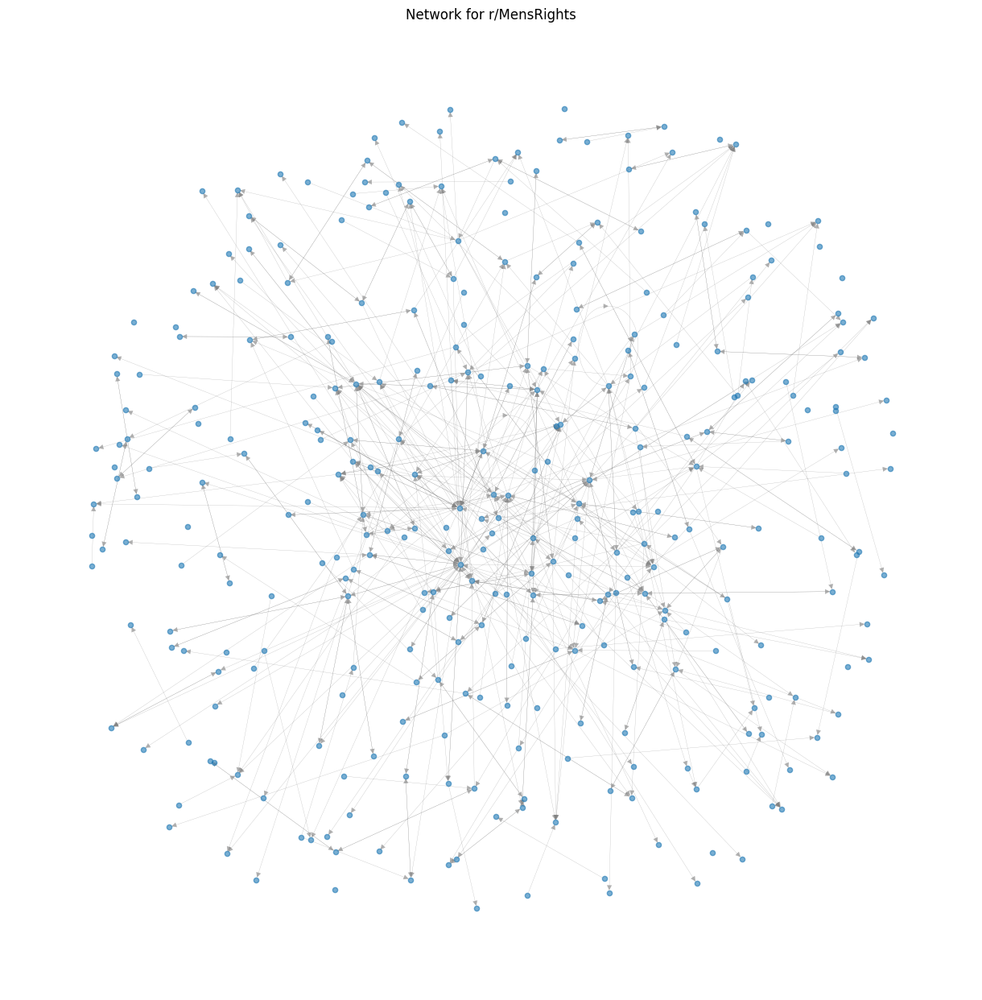

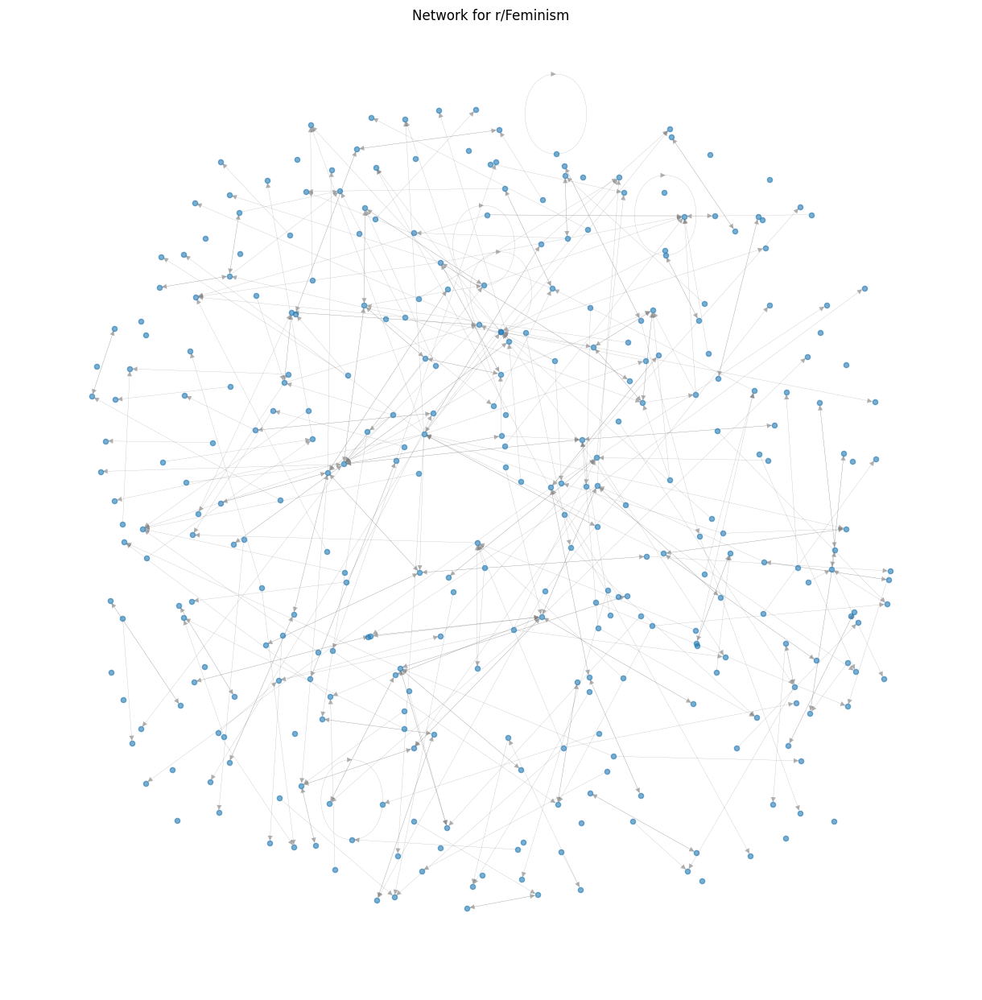

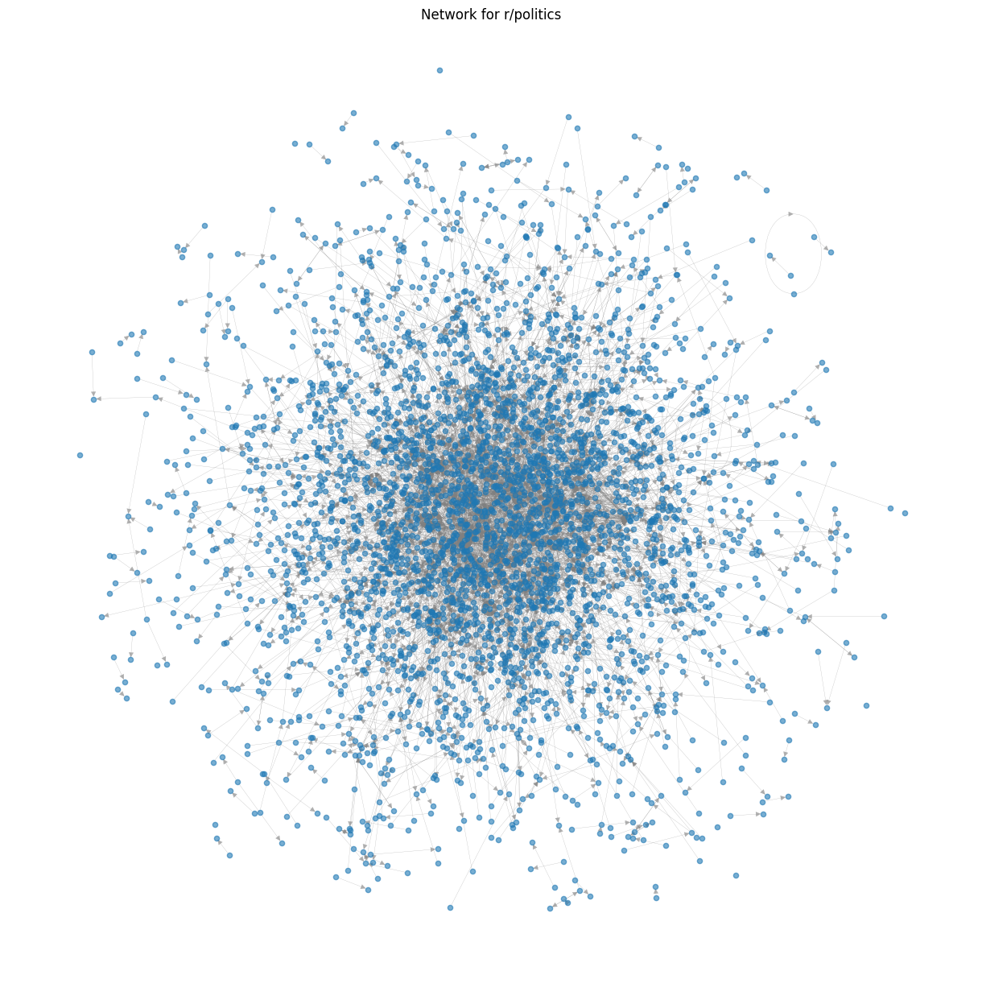

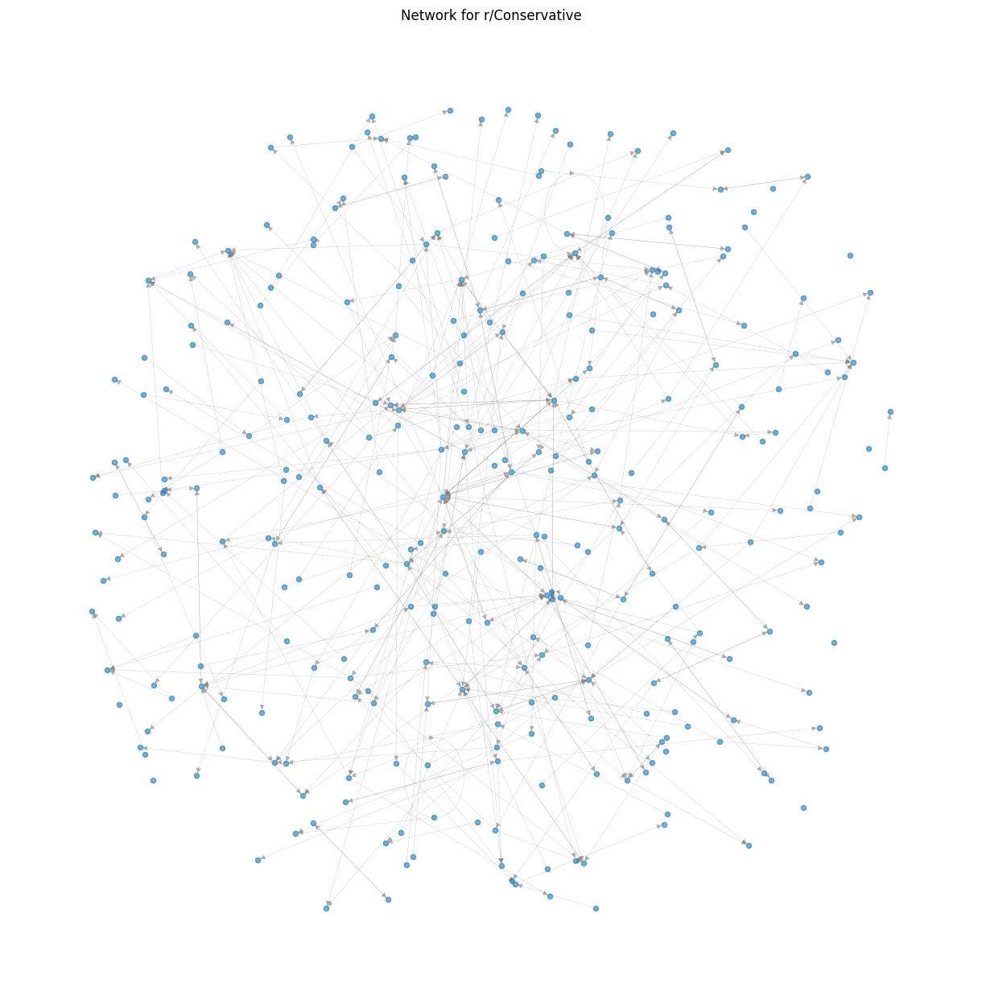

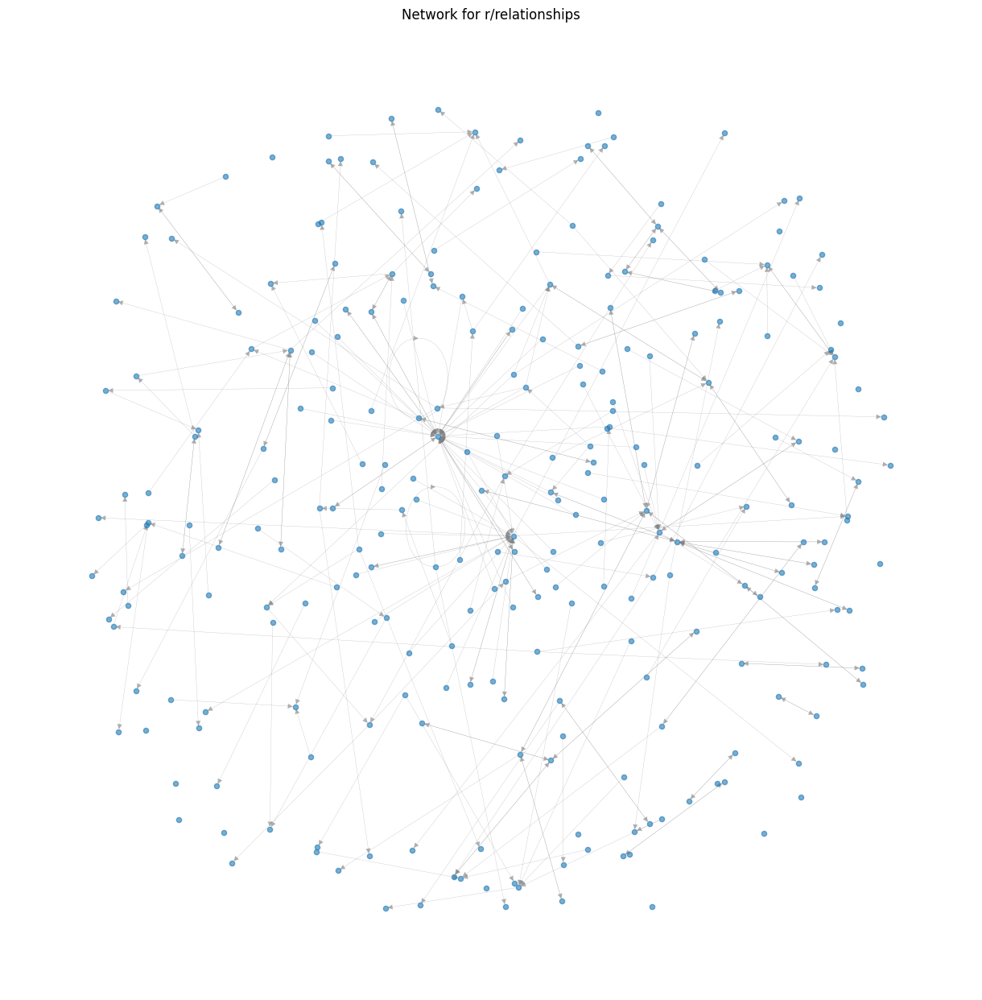

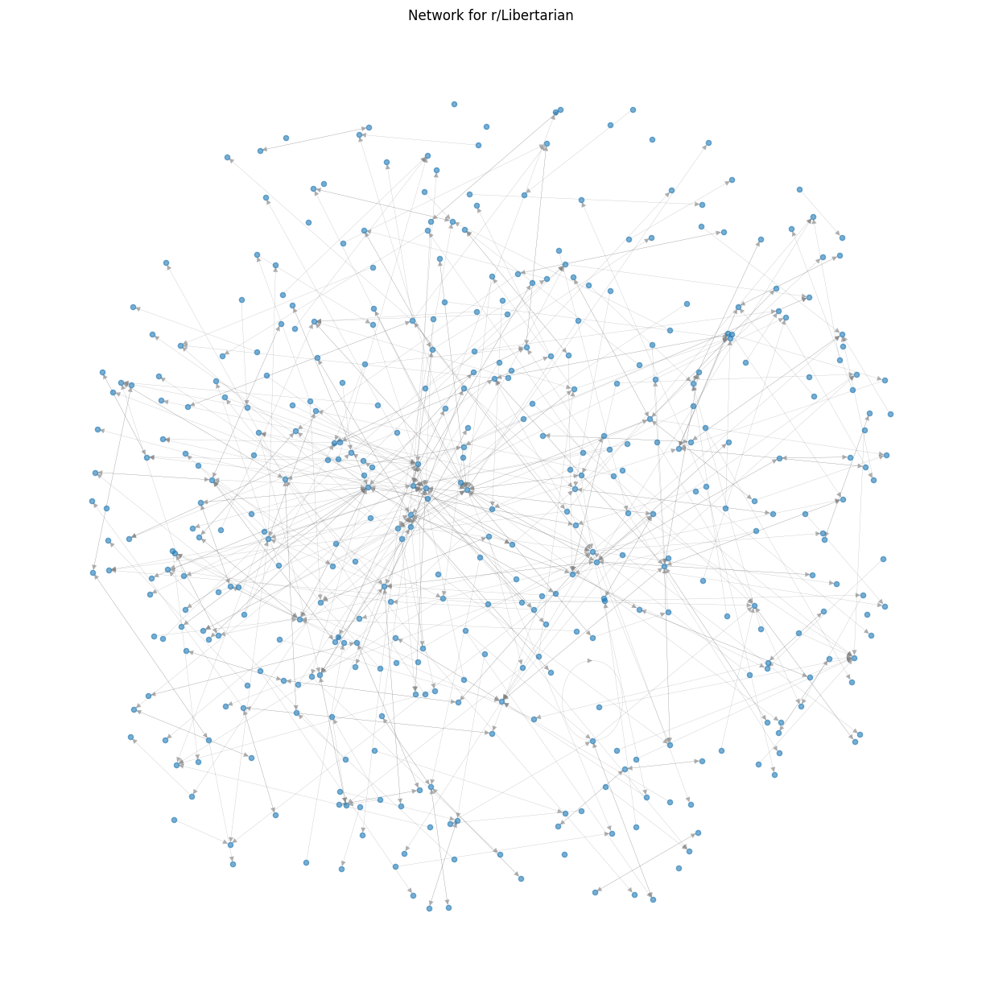

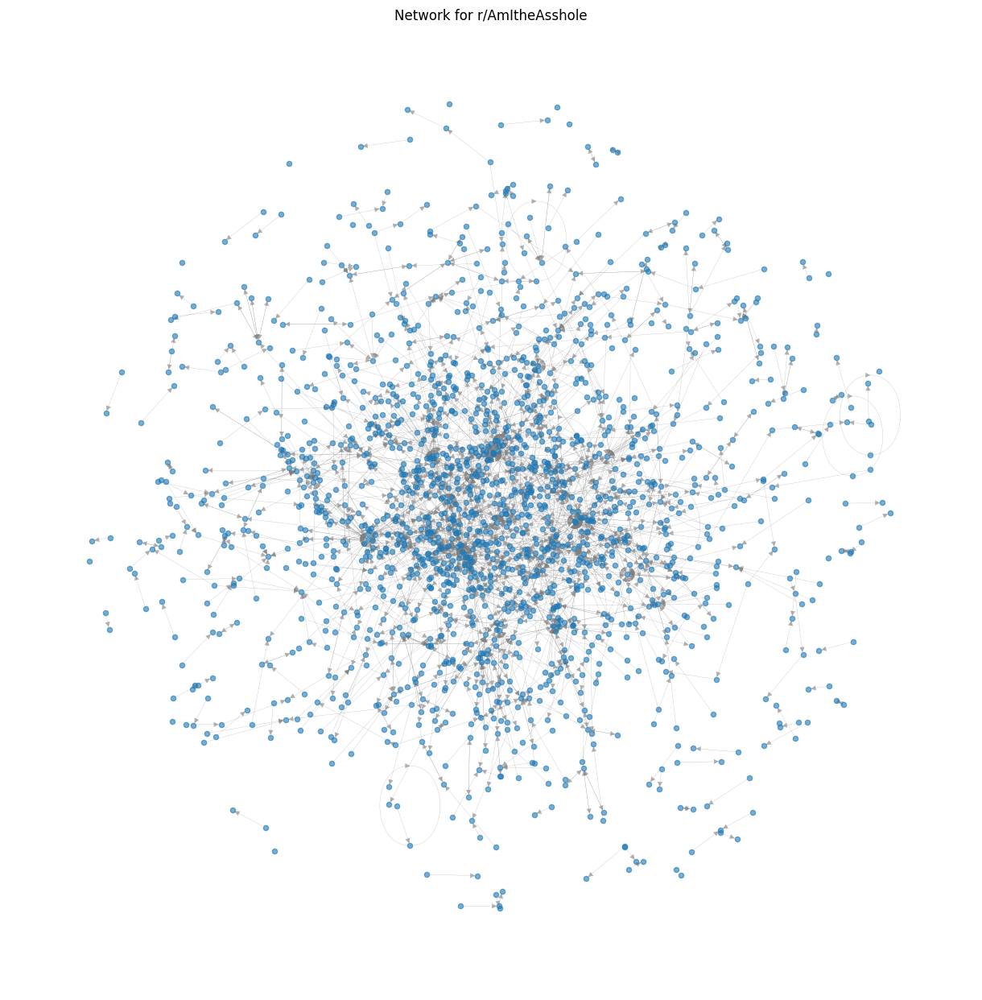

In [19]:
import community as community_louvain

results['analyzer'].visualize_subreddit_network('MensRights')
results['analyzer'].visualize_subreddit_network('Feminism')
results['analyzer'].visualize_subreddit_network('politics')
results['analyzer'].visualize_subreddit_network('Conservative')
results['analyzer'].visualize_subreddit_network('relationships')
results['analyzer'].visualize_subreddit_network('Libertarian')
results['analyzer'].visualize_subreddit_network('AmItheAsshole')


In [20]:
# get the comparison statistics using the compare method
comparison_stats = results['comparator'].compare()
# display the comparison statistics
display(comparison_stats)

,nodes,edges,density,avg_degree,degree_centralization,pagerank_centralization,modularity,communities
subreddit,,,,,,,,
AmItheAsshole,1742,2160,0.000712,0.001173,0.040781,0.010723,0.907022,174
relationships,260,257,0.003816,0.006178,0.102324,0.088791,0.911705,61
MensRights,318,495,0.004910,0.007718,0.099852,0.014842,0.728055,43
Feminism,322,357,0.003454,0.005515,0.044468,0.014148,0.905694,80
politics,3533,4607,0.000369,0.000660,0.033891,0.012721,0.836382,223
Conservative,302,387,0.004257,0.007305,0.066004,0.039092,0.763636,39
Libertarian,404,525,0.003225,0.005024,0.044714,0.020562,0.849239,56


In [22]:
# there is value of this analysis
df_priv = results['privilege_results']['MensRights']['top']
# There is no direct output for 'silenced_voices' from the current analysis.
# df_sil = results['privilege_results']['MensRights']['silenced_voices']
display(df_priv)

,author,mean,sum,count,pagerank,degree
79,DonKEKKK,5.428571,38,7,0.017940,0.018927
56,ComprehensivePipe448,3.000000,3,1,0.016160,0.003155
320,WhyDidntITextBack,10.125000,81,8,0.014654,0.018927
212,No_Treacle_1461,4.025641,157,39,0.013596,0.107256
4,4444-uuuu,3.545455,39,11,0.012372,0.034700
432,pm_me_your_passw0d,24.666667,74,3,0.012263,0.009464
314,Vegetable_Ad1732,8.962963,242,27,0.012214,0.066246
223,Pecking_Boi0330,37.000000,37,1,0.011802,0.006309
49,CatchWild9531,11.000000,22,2,0.011670,0.006309
181,LumpyAbbreviations24,11.000000,121,11,0.011485,0.031546


#### Sentiment and Network Influence Analysis

The `SentimentPowerAnalyzer` class is designed to delve into how a user's emotional tone (sentiment) in their comments might be related to their position and influence within the social network formed by comment replies on Reddit. While the provided code doesn't explicitly define a `SentimentPowerAnalyzer` class, the surrounding code segments (specifically the `PrivilegeAnalyzer`) indicate a likely intended function: to combine sentiment analysis with network analysis metrics. If a `SentimentPowerAnalyzer` were implemented, its primary purpose would be to calculate the sentiment of each comment using a tool like `TextBlob` (which is imported). It would then likely aggregate these sentiment scores (perhaps averaging them) for each author. The core of its analysis would involve correlating these author-level sentiment scores (e.g., average polarity or subjectivity) with the network centrality metrics (like PageRank or Degree Centrality) calculated by the `SubredditNetworkAnalyzer`. This correlation would reveal whether authors with higher network influence tend to express more positive, negative, or neutral sentiment, or if authors who frequently use a particular sentiment tone gain more influence. The function would likely iterate through subreddits, perform these calculations for each, and output the correlations, providing insights into the interplay between emotional expression and structural power in online communities.





In [23]:
# correlates sentiment with network centrality to eval power structure
class SentimentPowerAnalyzer:
    """analyze sentiment patterns across power structures"""
    def __init__(self, df_comments, metrics):
        self.df_comments = df_comments
        self.metrics = metrics
        self.sentiment_results = {}

    def compute_sentiment_scores(self):
        """compute sentiment for all comments"""
        print("computing sentiment scores...")

        # add sentiment columns to comments dataframe
        self.df_comments['sentiment_polarity'] = self.df_comments['body'].apply(
            lambda x: TextBlob(str(x).lower()).sentiment.polarity if pd.notna(x) else 0
        )
        self.df_comments['sentiment_subjectivity'] = self.df_comments['body'].apply(
            lambda x: TextBlob(str(x).lower()).sentiment.subjectivity if pd.notna(x) else 0
        )

        return self.df_comments

    def analyze_user_sentiment_by_power(self):
        """correlate user sentiment with centrality metrics"""
        print("analyzing sentiment by user power...")

        results = {}
        for sub in self.df_comments['subreddit'].unique():
            if sub not in self.metrics:
                continue

            sub_comments = self.df_comments[self.df_comments['subreddit'] == sub]

            # aggregate user sentiment and engagement
            user_sentiment = sub_comments.groupby('author').agg({
                'sentiment_polarity': ['mean', 'std', 'count'],
                'sentiment_subjectivity': 'mean',
                'score': ['mean', 'sum']
            }).round(4)

            # flatten column names
            user_sentiment.columns = ['_'.join(col).strip() for col in user_sentiment.columns]
            user_sentiment = user_sentiment.reset_index()

            # merge with centrality metrics
            if sub in self.metrics:
                user_sentiment['pagerank'] = user_sentiment['author'].map(self.metrics[sub]['pagerank'])
                user_sentiment['degree'] = user_sentiment['author'].map(self.metrics[sub]['degree'])
                user_sentiment['closeness'] = user_sentiment['author'].map(self.metrics[sub]['closeness'])

                # remove users not in network
                user_sentiment = user_sentiment.dropna(subset=['pagerank'])

                # correlations
                correlations = {
                    'pagerank_sentiment': user_sentiment['pagerank'].corr(user_sentiment['sentiment_polarity_mean']),
                    'degree_sentiment': user_sentiment['degree'].corr(user_sentiment['sentiment_polarity_mean']),
                    'pagerank_subjectivity': user_sentiment['pagerank'].corr(user_sentiment['sentiment_subjectivity_mean'])
                }

                results[sub] = {
                    'user_data': user_sentiment,
                    'correlations': correlations,
                    'top_positive': user_sentiment.nlargest(5, 'sentiment_polarity_mean'),
                    'top_negative': user_sentiment.nsmallest(5, 'sentiment_polarity_mean'),
                    'high_power_sentiment': user_sentiment.nlargest(10, 'pagerank')['sentiment_polarity_mean'].mean()
                }

        self.sentiment_results = results
        return results



In [24]:

# instantiate the SentimentPowerAnalyzer class
sentiment_analyzer = SentimentPowerAnalyzer(results['df_comments'], results['analyzer'].metrics)

# compute sentiment scores for all comments
df_comments_with_sentiment = sentiment_analyzer.compute_sentiment_scores()

# analyze user sentiment by power (centrality)
sentiment_analysis_results = sentiment_analyzer.analyze_user_sentiment_by_power()

# print Sentiment Analysis Results
print("\nSentiment Analysis Results:")
for sub, data in sentiment_analysis_results.items():
    print(f"\nSubreddit: r/{sub}")
    print("  Correlations (Pagerank vs. Avg Sentiment Polarity):", data['correlations']['pagerank_sentiment'])
    print("  Correlations (Degree vs. Avg Sentiment Polarity):", data['correlations']['degree_sentiment'])
    print("  Correlations (Pagerank vs. Avg Sentiment Subjectivity):", data['correlations']['pagerank_subjectivity'])
    print("\n  Top 5 Most Positive Authors:")
    print(data['top_positive'][['author', 'sentiment_polarity_mean', 'score_mean', 'pagerank']].to_string(index=False))
    print("\n  Top 5 Most Negative Authors:")
    print(data['top_negative'][['author', 'sentiment_polarity_mean', 'score_mean', 'pagerank']].to_string(index=False))
    print("\n  Mean Sentiment of High Power Authors (Top 10 by Pagerank):", data['high_power_sentiment'])




computing sentiment scores...
analyzing sentiment by user power...

Sentiment Analysis Results:

Subreddit: r/AmItheAsshole
  Correlations (Pagerank vs. Avg Sentiment Polarity): 0.0012274091765433544
  Correlations (Degree vs. Avg Sentiment Polarity): 0.00143429648964354
  Correlations (Pagerank vs. Avg Sentiment Subjectivity): -0.002720442492000517

  Top 5 Most Positive Authors:
              author  sentiment_polarity_mean  score_mean  pagerank
  Active_Warning4455                      1.0         8.0  0.000392
Fearless-Respond6766                      1.0         3.0  0.000156
ResponsibleStill6458                      1.0         2.0  0.000156
     Teleporting-Cat                      1.0         3.0  0.000156
       awgeezwhatnow                      1.0        13.0  0.000156

  Top 5 Most Negative Authors:
            author  sentiment_polarity_mean  score_mean  pagerank
         DomHaynie                     -1.0         2.0  0.000156
Particular-Owl2446                     -1.0 

## Based on sentiment output

**Power and Positivity**

Subreddits like r/politics and r/Libertarian stand out for their highest mean sentiment among top 10 most central users (Pagerank), with scores of 0.10324 and 0.11658, respectively. This suggests that the most influential users in these political subreddits tend to express more positive or hopeful sentiment, possibly reflecting persuasive rhetorical styles, ideological optimism, or alignment with community values. In contrast, r/MensRights has the lowest mean sentiment among high-power users (-0.06843), indicating a notably more negative emotional tone among central voices. This may align with grievance-based discourse, reflecting collective frustrations or oppositional narratives common in men’s rights communities.


**Weak Correlation Between Power and Sentiment**


Across all subreddits, correlation coefficients between Pagerank/Degree and sentiment polarity are small, mostly close to zero or slightly negative. For instance, r/AmItheAsshole has almost no correlation (Pagerank vs. sentiment polarity: 0.0012), while r/relationships shows a mild negative relationship (Degree: -0.0419). This suggests that being central in the reply network does not reliably predict sentiment tone. However, r/MensRights shows a mild positive correlation between Degree centrality and sentiment (0.0525), implying that more interactive users may also be slightly more expressive emotionally whether positively or negatively.




**Top Sentiment Extremes Are Not High-Power Users**


Authors with extreme sentiment scores (±1.0) across all subreddits generally have low Pagerank scores, indicating limited influence or reply engagement. This pattern suggests that highly emotional posts whether supportive or hostile may not garner broad interaction or may come from peripheral voices. For instance, r/Conservative’s most negative author (“doormouse321”) had a Pagerank of 0.0011, which is marginal in scale. Similarly, r/Feminism’s most positive author (“jupchurch97”) had 0.0017.



**Subreddit-Specific Sentiment Profiles**
Each subreddit reveals unique emotional contours:

* r/Feminism: Shows modest positivity among top users (0.0438) but weak negative correlation with sentiment, suggesting emotional tone is not centralized.


* r/relationships: Dominated by emotional expression, with many negative sentiment authors holding high scores, reflecting the personal struggles often shared in this space.



* r/AmItheAsshole: Displays near-zero correlation across the board, perhaps due to its judgment-based format, which encourages neutral storytelling with variable tone.



* r/Conservative and r/MensRights: Although generally less positive overall, show a few highly negative and high-score users, which might signal echo chambers or entrenched grievances being rewarded.


# Understanding the Discourse within subreddti


DiscourseAnalyzer class that detects blame language and keyphrases in subreddit comments. It begins with initialization, taking a DataFrame of comments and setting up blame patterns for various categories: systemic, gendered, and power blame. The `extract_keyphrases` method identifies the most common two- and three-word phrases in comments for a given subreddit using the `CountVectorizer` from `sklearn`, returning the top 20 phrases based on frequency.

Next, the `analyze_blame_attribution` method scans comments for sentences that match predefined blame patterns, counting occurrences of each blame type and storing examples (up to five) of matching sentences. The `construct_discourse_patterns` method iterates through each unique subreddit in the comments DataFrame, extracting keyphrases and analyzing blame attribution for each subreddit, storing these results in a dictionary.

An instance of the `DiscourseAnalyzer` is created using a DataFrame of comments, and the `construct_discourse_patterns` method is called to analyze the comments. The results are then printed, showing top keyphrases and blame attribution patterns for each subreddit. The output provides lists the most frequent phrases found in comments, along with their occurrence counts, and shows the count of sentences matching blame patterns, along with examples.

In [34]:
# discourse framing – detect blame language and dominant keyphrases in subreddits

import re
from collections import defaultdict
from nltk.tokenize import sent_tokenize

class DiscourseAnalyzer:
    """extract framing language and attribution patterns using sentence-level blame detection"""

    def __init__(self, df_comments):
        self.df_comments = df_comments
        self.discourse_patterns = {}

        self.blame_patterns = {
            'systemic': [
                r'system is (rigged|broken|unfair)',
                r'society (doesn\'t|ignores|devalues)',
                r'education system (is|fails)',
                r'the system (protects|hurts|targets|benefits)'
            ],
            'gendered': [
                r'(men|women) (are|always|never|should|cause)',
                r'toxic masculinity',
                r'(male|female) privilege',
                r'not all (men|women)',
            ],
            'power_blame': [
                r'(mods|media|government|they) (silence|control|blame|manipulate)',
                r'we are (ignored|silenced|excluded|not allowed)',
                r'no one (cares|listens|believes)'
            ]
        }

    def extract_keyphrases(self, subreddit):
        from sklearn.feature_extraction.text import CountVectorizer
        comments = self.df_comments[self.df_comments['subreddit'] == subreddit]['body'].dropna()
        vectorizer = CountVectorizer(ngram_range=(2, 3), stop_words='english', min_df=2) # Reduced min_df
        X = vectorizer.fit_transform(comments)
        phrases = vectorizer.get_feature_names_out()
        freqs = X.sum(axis=0).A1
        return sorted(zip(phrases, freqs), key=lambda x: x[1], reverse=True)[:20]

    def analyze_blame_attribution(self, subreddit):
        """find sentences that match blame regex patterns and return both counts and context"""
        comments = self.df_comments[self.df_comments['subreddit'] == subreddit]['body'].dropna()
        blame_counts = defaultdict(int)
        blame_examples = defaultdict(list)

        for text in comments:
            for sentence in sent_tokenize(str(text)):
                lower = sentence.lower()
                for group, patterns in self.blame_patterns.items():
                    for pat in patterns:
                        if re.search(pat, lower):
                            blame_counts[group] += 1
                            # Keep examples to a manageable number
                            if len(blame_examples[group]) < 5:
                                blame_examples[group].append(sentence.strip())

        return {"counts": dict(blame_counts), "examples": dict(blame_examples)}

    def construct_discourse_patterns(self):
        """build keyphrases and blame patterns per subreddit"""
        for sub in self.df_comments['subreddit'].unique():
            self.discourse_patterns[sub] = {
                'keyphrases': self.extract_keyphrases(sub),
                'blame_attribution': self.analyze_blame_attribution(sub)
            }
        return self.discourse_patterns

In [37]:

from nltk.tokenize import sent_tokenize

# Instantiate and run the DiscourseAnalyzer
discourse_analyzer = DiscourseAnalyzer(results['df_comments'])
discourse_patterns = discourse_analyzer.construct_discourse_patterns()

# print Discourse Analysis Results
print("\nDiscourse Analysis (Keyphrases and Blame Attribution)")
for sub, patterns in discourse_patterns.items():
    print(f"\nSubreddit: r/{sub}")

    # Print Top Keyphrases
    print("\n  Top Keyphrases:")
    if patterns['keyphrases']:
        for phrase, freq in patterns['keyphrases']:
            print(f"    - '{phrase}': {freq}")
    else:
        print("    (No keyphrases found)")

    # print Blame Attribution Patterns and Examples
    print("\n  Blame Attribution Patterns:")
    if patterns['blame_attribution']['counts']:
        for pattern_group, count in patterns['blame_attribution']['counts'].items():
            print(f"    - '{pattern_group}' count: {count}")
            if patterns['blame_attribution']['examples'].get(pattern_group):
                print(f"      Examples:")
                for example in patterns['blame_attribution']['examples'][pattern_group]:
                    print(f"        - {example[:200]}...") # print first 200 chars of example
            else:
                 print("      (No examples found)")
    else:
        print("    (No blame attribution patterns found)")


Discourse Analysis (Keyphrases and Blame Attribution)

Subreddit: r/AmItheAsshole

  Top Keyphrases:
    - 'sound like': 248
    - 'dont want': 137
    - 'feel like': 125
    - 'question concern': 117
    - 'litter box': 95
    - 'new husband': 88
    - 'dont know': 87
    - 'year old': 86
    - 'action performed': 85
    - 'action performed automatically': 85
    - 'bot action': 85
    - 'bot action performed': 85
    - 'egg toast': 85
    - 'performed automatically': 85
    - 'dont think': 79
    - 'silent treatment': 78
    - 'im sorry': 72
    - 'dont need': 66
    - 'make sure': 64
    - 'doesnt want': 59

  Blame Attribution Patterns:
    - 'gendered' count: 1
      Examples:
        - nta bible say anything woman woman best say men really use say men shouldnt sleep boy church changed translation time...

Subreddit: r/relationships

  Top Keyphrases:
    - 'sound like': 86
    - 'feel like': 47
    - 'dont want': 39
    - 'dont think': 37
    - 'doesnt want': 32
    - 'red flag'

**Thematic Association to Sentiment.**


The provided code defines the PowerDynamicsVisualizer class, which creates visualizations to analyze power dynamics within subreddit communities. It includes methods for generating an interactive network visualization of author influence, where nodes represent users and are colored by sentiment, and edges represent interactions. The class also generates a heatmap to display the sentiment associated with various topics across subreddits, and a comprehensive dashboard that compares multiple power metrics, such as degree centralization and modularity, alongside average sentiment. The dashboard uses subplots to effectively visualize these relationships. The code further instantiates the EnhancedThematicAnalyzer to analyze topic sentiment by power for relevant subreddits, and it produces the visualizations by iterating through the available subreddit graphs. Overall, this suite aims to provide a detailed and interactive exploration of how sentiment and user influence intersect in online discussions.

In [68]:
# comprehensive visualization suite
class PowerDynamicsVisualizer:
    """create comprehensive visualizations for power dynamics analysis"""
    def __init__(self, results, sentiment_results, discourse_patterns):
        self.results = results
        self.sentiment_results = sentiment_results
        self.discourse_patterns = discourse_patterns

    def create_author_influence_map(self, subreddit):
        """create interactive network visualization with sentiment coloring"""
        if subreddit not in self.results['analyzer'].graphs:
            print(f"no graph data for r/{subreddit}")
            return

        G = self.results['analyzer'].graphs[subreddit]
        metrics = self.results['analyzer'].metrics[subreddit]

        # get sentiment data if available
        sentiment_data = {}
        if subreddit in self.sentiment_results:
            user_sentiment = self.sentiment_results[subreddit]['user_data']
            sentiment_data = dict(zip(user_sentiment['author'], user_sentiment['sentiment_polarity_mean']))

        # create layout
        pos = nx.spring_layout(G, k=0.3, iterations=20)

        # prepare node data with modern styling
        pagerank_values = [metrics['pagerank'][node] for node in G.nodes()]
        min_size, max_size = 8, 35
        size_range = max(pagerank_values) - min(pagerank_values)

        node_trace = go.Scatter(
            x=[pos[node][0] for node in G.nodes()],
            y=[pos[node][1] for node in G.nodes()],
            mode='markers+text',
            text=[node if metrics['pagerank'][node] > np.percentile(list(metrics['pagerank'].values()), 90) else ''
                  for node in G.nodes()],
            textposition="middle center",
            textfont=dict(size=10, color='white'),
            marker=dict(
                size=[min_size + (max_size - min_size) *
                      ((metrics['pagerank'][node] - min(pagerank_values)) / size_range)
                      for node in G.nodes()],
                color=[sentiment_data.get(node, 0) for node in G.nodes()],
                colorscale='Portland',
                colorbar=dict(title="Avg Sentiment", thickness=15, len=0.5),
                line=dict(width=1, color='#2a2a2a'),
                opacity=0.9
            ),
            hovertemplate='<b>%{text}</b><br>PageRank: %{marker.size:.4f}<br>Sentiment: %{marker.color:.2f}<extra></extra>'
        )

        # prepare edge data with modern styling
        edge_x, edge_y = [], []
        for edge in G.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=0.5, color='rgba(150, 150, 150, 0.2)'),
            hoverinfo='none',
            mode='lines'
        )

        # create figure with modern layout
        fig = go.Figure(data=[edge_trace, node_trace])
        fig.update_layout(
            title=f'<b>Author Influence Network: r/{subreddit}</b>',
            title_font_size=20,
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20, l=20, r=20, t=60),
            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            plot_bgcolor='#f8f9fa',
            paper_bgcolor='#f8f9fa',
            height=650
        )

        fig.show()
        return fig

    def create_topic_sentiment_heatmap(self, topic_results):
        """create heatmap showing topic sentiment across subreddits"""
        # prepare data for heatmap
        heatmap_data = []
        subreddits = []
        topics = []

        for sub, data in topic_results.items():
            if 'topic_sentiment' not in data:
                continue

            subreddits.append(sub)
            topic_sentiments = data['topic_sentiment']['sentiment_polarity']['mean']
            topic_words = data['topic_words']

            for topic_id, sentiment in topic_sentiments.items():
                topic_label = f"topic {topic_id}: {topic_words[topic_id][:50]}..."
                if topic_label not in topics:
                    topics.append(topic_label)
                heatmap_data.append([sub, topic_label, sentiment])

        # create pivot table
        df_heatmap = pd.DataFrame(heatmap_data, columns=['subreddit', 'topic', 'sentiment'])
        pivot_df = df_heatmap.pivot(index='topic', columns='subreddit', values='sentiment')

        # create enhanced heatmap
        fig = px.imshow(
            pivot_df,
            color_continuous_scale='RdBu',
            title='<b>Topic Sentiment Across Subreddits</b>',
            aspect="auto",
            height=700
        )

        fig.update_layout(
            xaxis_title="Subreddit",
            yaxis_title="Topic (Top Words)",
            font=dict(size=12),
            title_font_size=20,
            margin=dict(t=100),
            plot_bgcolor='#f8f9fa',
            paper_bgcolor='#f8f9fa'
        )

        # annotations for better readability
        fig.update_traces(
            hovertemplate='<b>Subreddit:</b> %{x}<br><b>Topic:</b> %{y}<br><b>Sentiment:</b> %{z:.2f}',
            texttemplate="%{z:.2f}",
            textfont={"size":10}
        )

        fig.update_coloraxes(
            colorbar=dict(
                title="Sentiment",
                thickness=20,
                len=0.75
            )
        )

        fig.show()
        return fig

    def create_subreddit_comparison_dashboard(self):
        """create comprehensive comparison dashboard"""
        comparison_stats = self.results['comparison_stats']

        # add sentiment data to comparison
        sentiment_summary = {}
        for sub, data in self.sentiment_results.items():
            if 'user_data' in data:
                sentiment_summary[sub] = data['user_data']['sentiment_polarity_mean'].mean()

        comparison_stats['avg_sentiment'] = comparison_stats.index.map(sentiment_summary)

        # create subplots
        fig = make_subplots(
            rows=2, cols=2,
            subplot_titles=(
                '<b>Degree Centralization</b>',
                '<b>Modularity vs Sentiment</b>',
                '<b>Community Count</b>',
                '<b>Power Concentration</b>'
            ),
            specs=[[{"secondary_y": False}, {"secondary_y": True}],
                   [{"secondary_y": False}, {"secondary_y": False}]],
            vertical_spacing=0.12,
            horizontal_spacing=0.1
        )

        # color palette
        colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA']

        # degree centralization
        fig.add_trace(
            go.Bar(
                x=comparison_stats.index,
                y=comparison_stats['degree_centralization'],
                name='Degree Centralization',
                marker_color=colors[0],
                marker_line_color='#2a2a2a',
                marker_line_width=0.5
            ),
            row=1, col=1
        )

        # modularity vs sentiment
        fig.add_trace(
            go.Scatter(
                x=comparison_stats.index,
                y=comparison_stats['modularity'],
                mode='markers+lines',
                name='Modularity',
                marker=dict(size=14, color=colors[1], line=dict(width=1, color='#2a2a2a')),
                line=dict(width=3),
                yaxis='y1'
            ),
            row=1, col=2
        )

        fig.add_trace(
            go.Scatter(
                x=comparison_stats.index,
                y=comparison_stats['avg_sentiment'],
                mode='markers+lines',
                name='Avg Sentiment',
                marker=dict(size=14, color=colors[2], symbol='diamond', line=dict(width=1, color='#2a2a2a')),
                line=dict(width=3, dash='dot'),
                yaxis='y2'
            ),
            row=1, col=2
        )

        # community count
        fig.add_trace(
            go.Bar(
                x=comparison_stats.index,
                y=comparison_stats['communities'],
                name='Communities',
                marker_color=colors[2],
                marker_line_color='#2a2a2a',
                marker_line_width=0.5
            ),
            row=2, col=1
        )

        # power concentration (pagerank centralization)
        fig.add_trace(
            go.Bar(
                x=comparison_stats.index,
                y=comparison_stats['pagerank_centralization'],
                name='Pagerank Centralization',
                marker_color=colors[3],
                marker_line_color='#2a2a2a',
                marker_line_width=0.5
            ),
            row=2, col=2
        )

        #  layout and styling
        fig.update_layout(
            height=850,
            title_text="<b>Subreddit Power Dynamics Comparison</b>",
            title_font_size=24,
            showlegend=True,
            legend=dict(orientation="h", yanchor="bottom", y=-0.2, xanchor="center", x=0.5),
            plot_bgcolor='#f8f9fa',
            paper_bgcolor='#f8f9fa',
            hoverlabel=dict(bgcolor="white", font_size=12)
        )

        #  axis titles
        fig.update_yaxes(title_text="Degree Centralization", row=1, col=1)
        fig.update_yaxes(title_text="Modularity", row=1, col=2, secondary_y=False)
        fig.update_yaxes(title_text="Sentiment", row=1, col=2, secondary_y=True)
        fig.update_yaxes(title_text="Community Count", row=2, col=1)
        fig.update_yaxes(title_text="Pagerank Centralization", row=2, col=2)

        #  grid and ticks
        fig.update_xaxes(showline=True, linewidth=1, linecolor='lightgray')
        fig.update_yaxes(showline=True, linewidth=1, linecolor='lightgray', gridcolor='rgba(0,0,0,0.05)')

        fig.show()
        return fig
# instantiate the EnhancedThematicAnalyzer class
enhanced_thematic_analyzer = EnhancedThematicAnalyzer(
    results['df_comments'], results['analyzer'].metrics, sentiment_analysis_results
)

# analyze topic sentiment by power for relevant subreddits
topic_sentiment_results = {}
for sub in results['analyzer'].graphs.keys(): # Use subreddits with network graphs
    topic_result = enhanced_thematic_analyzer.analyze_topic_sentiment_by_power(sub)
    if topic_result:
        topic_sentiment_results[sub] = topic_result

# instantiate the PowerDynamicsVisualizer class
visualizer = PowerDynamicsVisualizer(
    results, sentiment_analysis_results, discourse_patterns
)

# author Influence Maps
print("\n  Author Influence Maps:")
for sub in results['analyzer'].graphs.keys():
    visualizer.create_author_influence_map(sub)

# topic Sentiment Heatmap (if sufficient data)
if topic_sentiment_results:
    print("\n  Topic Sentiment Heatmap:")
    visualizer.create_topic_sentiment_heatmap(topic_sentiment_results)
else:
    print("\n  Skipping Topic Sentiment Heatmap: Insufficient data from EnhancedThematicAnalyzer.")


# subreddit Comparison Dashboard
print("\n  Subreddit Comparison Dashboard:")
visualizer.create_subreddit_comparison_dashboard()


# author Influence Maps
print("\n  Author Influence Maps:")
for sub in results['analyzer'].graphs.keys():
    visualizer.create_author_influence_map(sub)

# topic Sentiment Heatmap (if sufficient data)
if topic_sentiment_results:
    print("\n  Topic Sentiment Heatmap:")
    visualizer.create_topic_sentiment_heatmap(topic_sentiment_results)

# subreddit Comparison Dashboard
print("\n  Subreddit Comparison Dashboard:")
visualizer.create_subreddit_comparison_dashboard()

analyzing topic-sentiment-power for r/AmItheAsshole...
analyzing topic-sentiment-power for r/relationships...
analyzing topic-sentiment-power for r/MensRights...
analyzing topic-sentiment-power for r/Feminism...
analyzing topic-sentiment-power for r/politics...
analyzing topic-sentiment-power for r/Conservative...
analyzing topic-sentiment-power for r/Libertarian...

  Author Influence Maps:



  Topic Sentiment Heatmap:



  Subreddit Comparison Dashboard:



  Author Influence Maps:



  Topic Sentiment Heatmap:



  Subreddit Comparison Dashboard:


## Network Connectivity Plot & Subreddit Power Dynamics Comparison


Purpose: This graph visualizes community structure by showing user interactions, with node color representing average sentiment and node size indicating user influence. The diverse colors range from deep blue (very negative sentiment) to bright red (very positive sentiment), suggesting a highly active community with various interactions.



### Topic Sentiment Across Subreddits
Purpose: This chart identifies key topics based on frequent words and shows the average sentiment of related comments within each subreddit. Positive sentiment is indicated by blue and positive values, while red and negative values indicate negative sentiment.

* "NTA" and "Relationships": Topics with terms like "nta" show low to neutral sentiment across subreddits, reflecting conflict-oriented discussions. For instance, Topic 1 in r/relationships has a positive sentiment of 0.08, while in r/politics it’s only 0.05.

* "Trump" and "Politics": Topic 4, containing "trump" and "politics," shows mixed sentiment—slightly negative in r/politics but neutral at 0.06 in r/Conservative, reflecting the community’s political leanings.

* Positive Topics: Topics related to "love" and "marriage" have notably positive sentiments, especially in r/Feminism (0.09) and r/relationships (0.05), indicating a more optimistic tone in these discussions.

* Negative Topics: Topics like "abortion" and "police" consistently show lower sentiments. The r/AmItheAsshole subreddit has a lower sentiment for topics related to "nta" and "dog," typical of conflict-driven discussions.



### Subreddit Power Dynamics Comparison


Degree Centralization: This bar chart measures network concentration among users. r/relationships exhibits the highest degree centralization, indicating a star-like structure centered on a few highly connected users. In contrast, r/Feminism and r/AmItheAsshole are more decentralized, with influence spread evenly.

Modularity vs. Sentiment: A line graph shows network modularity (red) and average sentiment (green). High modularity scores suggest distinct communities, while r/MensRights has lower modularity, indicating less division among users. The average sentiment remains close to zero, confirming a largely neutral tone across communities.

Community Count: This bar chart visualizes the number of distinct communities within each subreddit. r/politics has the highest community count, reflecting its diverse ideologies. r/AmItheAsshole also shows a high count due to varied topics, while r/relationships and r/MensRights have fewer communities, aligning with their higher centralization.

PageRank Centralization: This chart measures influence concentration using the PageRank algorithm. r/relationships stands out with high centralization, indicating dominance by a few influential users. r/Conservative also shows relatively high concentration, while r/AmItheAsshole, r/Feminism, and r/MensRights display a more egalitarian power distribution.



# Analyzing Power and Structure in Reddit Networks


The ComparativePowerAnalyzer class is designed to compare power dynamics across different subreddits.This class will likely coordinate analyses from these individual components to offer a combined view of how power structures and conversation patterns vary between online communities. It is expected to take input from the results of network analysis, community detection, and privilege analysis.

The primary function of the ComparativePowerAnalyzer would be to compare various metrics. It also look at community structure, which includes modularity and the number of communities, as well as the relationship between user influence and comment reception, specifically analyzing the correlation between centrality and comment scores across different subreddits. By aggregating and comparing these metrics, the ComparativePowerAnalyzer aims to draw conclusions about which subreddits have more centralized power, how community divisions affect discussions, and whether user influence leads to positive feedback on comments in different online spaces.

In [52]:
# comparative power analysis
class ComparativePowerAnalyzer:
    """conduct comprehensive comparative analysis of power structures"""
    def __init__(self, results, sentiment_results, discourse_patterns):
        self.results = results
        self.sentiment_results = sentiment_results
        self.discourse_patterns = discourse_patterns

    def identify_dominant_users(self, subreddit, top_n=10):
        """identify users with combined high centrality and engagement"""
        if subreddit not in self.results['analyzer'].metrics:
            return None

        metrics = self.results['analyzer'].metrics[subreddit]

        # combine centrality metrics
        combined_power = {}
        for user in metrics['pagerank'].keys():
            combined_power[user] = (
                metrics['pagerank'].get(user, 0) * 0.4 +
                metrics['degree'].get(user, 0) * 0.3 +
                metrics['closeness'].get(user, 0) * 0.3
            )

        # get top users
        top_users = sorted(combined_power.items(), key=lambda x: x[1], reverse=True)[:top_n]

        # add sentiment and engagement data
        dominant_analysis = []
        if subreddit in self.sentiment_results:
            user_data = self.sentiment_results[subreddit]['user_data'].set_index('author')

            for user, power_score in top_users:
                user_info = {
                    'user': user,
                    'combined_power': power_score,
                    'pagerank': metrics['pagerank'].get(user, 0),
                    'degree': metrics['degree'].get(user, 0),
                    'closeness': metrics['closeness'].get(user, 0)
                }

                if user in user_data.index:
                    user_stats = user_data.loc[user]
                    user_info.update({
                        'avg_sentiment': user_stats['sentiment_polarity_mean'],
                        'comment_count': user_stats['sentiment_polarity_count'],
                        'avg_score': user_stats['score_mean']
                    })

                dominant_analysis.append(user_info)

        return pd.DataFrame(dominant_analysis)

    def analyze_thematic_dominance(self):
        """analyze which themes dominate in central vs peripheral clusters"""
        thematic_dominance = {}

        for sub in self.results['analyzer'].graphs.keys():
            if sub in self.discourse_patterns:
                # get community structure
                communities = self.results['detector'].communities[sub]

                # identify central vs peripheral communities
                # (communities with high-centrality users vs low-centrality users)
                metrics = self.results['analyzer'].metrics[sub]

                central_communities = []
                peripheral_communities = []

                for comm_id, members in communities['communities'].items():
                    avg_centrality = np.mean([metrics['pagerank'].get(member, 0) for member in members])
                    if avg_centrality > np.percentile(list(metrics['pagerank'].values()), 75):
                        central_communities.extend(members)
                    elif avg_centrality < np.percentile(list(metrics['pagerank'].values()), 25):
                        peripheral_communities.extend(members)

                thematic_dominance[sub] = {
                    'central_users': len(central_communities),
                    'peripheral_users': len(peripheral_communities),
                    'keyphrases': self.discourse_patterns[sub]['keyphrases'],
                    'blame_patterns': self.discourse_patterns[sub]['blame_attribution']
                }

        return thematic_dominance


In [53]:
# comparative power distribution and dominant users
class ComparativePowerAnalyzer:
    """conduct comprehensive comparative analysis of power structures"""
    def __init__(self, results, sentiment_results, discourse_patterns):
        self.results = results
        self.sentiment_results = sentiment_results
        self.discourse_patterns = discourse_patterns

    def identify_dominant_users(self, subreddit, top_n=10):
        """identify users with combined high centrality and engagement"""
        if subreddit not in self.results['analyzer'].metrics:
            return None

        metrics = self.results['analyzer'].metrics[subreddit]

        # combine centrality metrics
        combined_power = {}
        for user in metrics['pagerank'].keys():
            combined_power[user] = (
                metrics['pagerank'].get(user, 0) * 0.4 +
                metrics['degree'].get(user, 0) * 0.3 +
                metrics['closeness'].get(user, 0) * 0.3
            )

        # get top users
        top_users = sorted(combined_power.items(), key=lambda x: x[1], reverse=True)[:top_n]

        # add sentiment and engagement data
        dominant_analysis = []
        if subreddit in self.sentiment_results:
            user_data = self.sentiment_results[subreddit]['user_data'].set_index('author')

            for user, power_score in top_users:
                user_info = {
                    'user': user,
                    'combined_power': power_score,
                    'pagerank': metrics['pagerank'].get(user, 0),
                    'degree': metrics['degree'].get(user, 0),
                    'closeness': metrics['closeness'].get(user, 0)
                }

                if user in user_data.index:
                    user_stats = user_data.loc[user]
                    user_info.update({
                        'avg_sentiment': user_stats['sentiment_polarity_mean'],
                        'comment_count': user_stats['sentiment_polarity_count'],
                        'avg_score': user_stats['score_mean']
                    })

                dominant_analysis.append(user_info)

        return pd.DataFrame(dominant_analysis)


    def analyze_thematic_dominance(self):
        """analyze which themes dominate in central vs peripheral clusters"""
        thematic_dominance = {}

        for sub in self.results['analyzer'].graphs.keys():
            if sub in self.discourse_patterns:
                # get community structure
                communities = self.results['detector'].communities[sub]

                # identify central vs peripheral communities
                # (communities with high-centrality users vs low-centrality users)
                metrics = self.results['analyzer'].metrics[sub]

                central_communities = []
                peripheral_communities = []

                for comm_id, members in communities['communities'].items():
                    avg_centrality = np.mean([metrics['pagerank'].get(member, 0) for member in members])
                    if avg_centrality > np.percentile(list(metrics['pagerank'].values()), 75):
                        central_communities.extend(members)
                    elif avg_centrality < np.percentile(list(metrics['pagerank'].values()), 25):
                        peripheral_communities.extend(members)

                thematic_dominance[sub] = {
                    'central_users': len(central_communities),
                    'peripheral_users': len(peripheral_communities),
                    'keyphrases': self.discourse_patterns[sub]['keyphrases'],
                    'blame_patterns': self.discourse_patterns[sub]['blame_attribution']
                }

        return thematic_dominance

    def generate_power_report(self):
        """generate comprehensive power analysis report"""

        # overall statistics
        comparison_stats = self.results['comparator'].compare()
        print("subreddit power structures:")
        print(comparison_stats.round(4))
        print("\n")

        # dominant users by subreddit
        print("dominant users analysis:")
        for sub in self.results['analyzer'].graphs.keys():
            dominant_users = self.identify_dominant_users(sub, top_n=5)
            if dominant_users is not None and not dominant_users.empty:
                print(f"\nr/{sub} top 5 dominant users:")
                print(dominant_users[['user', 'combined_power', 'avg_sentiment', 'comment_count']].round(4))

        # thematic analysis
        print("\n\nthematic dominance patterns:")
        thematic_dominance = self.analyze_thematic_dominance()
        for sub, analysis in thematic_dominance.items():
            print(f"\nr/{sub}:")
            print(f"  central users: {analysis['central_users']}")
            print(f"  peripheral users: {analysis['peripheral_users']}")
            print(f"  top keyphrases: {analysis['keyphrases'][:5]}")
            if analysis['blame_patterns']:
                print(f"  blame patterns: {list(analysis['blame_patterns'].keys())[:3]}")


# Instantiate the ComparativePowerAnalyzer
comparative_analyzer = ComparativePowerAnalyzer(
    results, sentiment_analysis_results, discourse_patterns
)

# Generate and print the power analysis report
comparative_analyzer.generate_power_report()




subreddit power structures:
               nodes  edges  density  avg_degree  degree_centralization  \
subreddit                                                                 
AmItheAsshole   1742   2160   0.0007      0.0012                 0.0408   
relationships    260    257   0.0038      0.0062                 0.1023   
MensRights       318    495   0.0049      0.0077                 0.0999   
Feminism         322    357   0.0035      0.0055                 0.0445   
politics        3533   4607   0.0004      0.0007                 0.0339   
Conservative     302    387   0.0043      0.0073                 0.0660   
Libertarian      404    525   0.0032      0.0050                 0.0447   

               pagerank_centralization  modularity  communities  
subreddit                                                        
AmItheAsshole                   0.0107      0.9070          174  
relationships                   0.0888      0.9117           61  
MensRights                      

### Visualization of sentiment & power metrics  

This code visualizes the relationship between sentiment and power metrics across subreddits using interactive plots from Plotly. It starts with the plot_sentiment_correlations function, which generates a heatmap to show correlations between power metrics (like PageRank and Degree Centrality) and sentiment measures (such as average sentiment polarity). The data is organized into a DataFrame, and if it contains values, a heatmap is created with a red-blue color scale to indicate positive and negative relationships.

Next, the plot_power_sentiment_scatter_enhanced function produces scatter plots that illustrate how power metrics relate to average user sentiment for a specific subreddit. It checks for data availability, renames columns for clarity, and handles non-finite values. The function creates subplots for PageRank and Degree Centrality against average sentiment polarity, with scatter points representing users, sized and colored by their average sentiment. Trendlines are added, and layout settings enhance readability.

After defining these functions, the code updates the results dictionary with sentiment analysis and executes the visualization functions, generating the heatmap and scatter plots for each subreddit. Overall, this code aims to provide insights into how sentiment relates to user influence in subreddit communities, enhancing the understanding of online discourse dynamics.

In [63]:
# sentiment visulization

def plot_sentiment_correlations(sentiment_results):
    """interactive heatmap of sentiment-power correlations across subreddits using Plotly"""
    # prepare data
    corr_data = []
    for sub, res in sentiment_results.items():
        if 'correlations' in res:
            corr_data.append({
                "Subreddit": sub,
                "Pagerank Correlation with Avg Sentiment": res['correlations'].get('pagerank_sentiment', None),
                "Degree Correlation with Avg Sentiment": res['correlations'].get('degree_sentiment', None),
                "Pagerank Correlation with Avg Subjectivity": res['correlations'].get('pagerank_subjectivity', None),
            })

    df_corr = pd.DataFrame(corr_data).set_index("Subreddit")

    if df_corr.empty:
        print("no correlation data available for visualization.")
        return

    # create Plotly heatmap with modern styling
    fig = px.imshow(
        df_corr.T,
        text_auto=".3f",  # format correlation values with 3 decimal places
        aspect="auto", # adjust aspect ratio automatically
        color_continuous_scale='plasma', # modern plasma colorscale
        color_continuous_midpoint=0, # center the scale at 0
        title='<b>Power Metrics vs. Sentiment Correlations</b><br><sub>Interactive correlation analysis across subreddit communities</sub>',
        labels=dict(x="", y="", color="Correlation Strength"),
    )

    fig.update_layout(
        template="plotly_dark",
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)',
        font=dict(family="Inter, -apple-system, BlinkMacSystemFont, sans-serif", size=12, color="#E5E7EB"),
        title=dict(
            font=dict(size=20, color="#F9FAFB"),
            x=0.5,
            y=0.95,
            xanchor='center'
        ),
        margin=dict(l=40, r=40, t=100, b=60),
        xaxis_title="<b>Subreddit Communities</b>",
        yaxis_title="<b>Correlation Metrics</b>",
        xaxis=dict(
            tickangle=-45,
            tickfont=dict(size=11, color="#D1D5DB"),
            title_font=dict(size=14, color="#F3F4F6"),
            gridcolor='rgba(75, 85, 99, 0.2)',
            linecolor='rgba(107, 114, 128, 0.3)'
        ),
        yaxis=dict(
            tickfont=dict(size=11, color="#D1D5DB"),
            title_font=dict(size=14, color="#F3F4F6"),
            gridcolor='rgba(75, 85, 99, 0.2)',
            linecolor='rgba(107, 114, 128, 0.3)'
        ),
        coloraxis=dict(
            colorbar=dict(
                title=dict(text="<b>Correlation<br>Strength</b>", font=dict(size=12)),
                tickfont=dict(size=10),
                len=0.8,
                thickness=15,
                bgcolor='rgba(31, 41, 55, 0.8)',
                bordercolor='rgba(107, 114, 128, 0.3)',
                borderwidth=1
            )
        )
    )

    # add subtle hover effects
    fig.update_traces(
        hovertemplate="<b>%{y}</b><br>" +
                     "Subreddit: <b>%{x}</b><br>" +
                     "Correlation: <b>%{z:.3f}</b><br>" +
                     "<extra></extra>",
        hoverlabel=dict(
            bgcolor="rgba(17, 24, 39, 0.95)",
            bordercolor="rgba(107, 114, 128, 0.5)",
            font=dict(color="#F9FAFB", size=11)
        )
    )

    fig.show()
    return fig


def plot_power_sentiment_scatter_enhanced(sentiment_results, subreddit):
    """interactive scatter plot for power metrics vs sentiment using Plotly"""
    if subreddit not in sentiment_results or 'user_data' not in sentiment_results[subreddit]:
        print(f"no data available for r/{subreddit} to plot power-sentiment scatter.")
        return

    data = sentiment_results[subreddit]['user_data'].copy()

    # rename columns for clarity in plot labels
    data = data.rename(columns={
        'sentiment_polarity_mean': 'Avg. Sentiment Polarity',
        'sentiment_subjectivity_mean': 'Avg. Sentiment Subjectivity',
        'score_mean': 'Avg. Comment Score',
        'sentiment_polarity_count': 'Comment Count',
        'pagerank': 'Pagerank',
        'degree': 'Degree Centrality',
        'closeness': 'Closeness Centrality',
        'author': 'Author'
    })

    # handle potential non-finite values in 'Avg. Comment Score' and calculate marker size
    avg_score = data['Avg. Comment Score'].replace([np.inf, -np.inf], np.nan).fillna(0)
    max_score = avg_score.max()
    if max_score > 0:
        marker_size = (avg_score / max_score) * 35 + 8
    else:
        marker_size = 12 # default size if max_score is 0

    # create a scatter matrix for multiple power metrics vs sentiment with modern styling
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=(
            f"<b>Pagerank Influence</b><br><sub>r/{subreddit}</sub>",
            f"<b>Network Connectivity</b><br><sub>r/{subreddit}</sub>"
        ),
        horizontal_spacing=0.12
    )

    # modern color palette for sentiment
    sentiment_colors = data['Avg. Sentiment Polarity']

    # Pagerank plot with enhanced styling
    fig.add_trace(
        go.Scatter(
            x=data['Pagerank'],
            y=data['Avg. Sentiment Polarity'],
            mode='markers',
            name='Community Members',
            marker=dict(
                size=marker_size,
                color=sentiment_colors,
                colorscale='viridis',
                colorbar=dict(
                    title=dict(text="<b>Sentiment<br>Polarity</b>", font=dict(size=12)),
                    len=0.8,
                    thickness=15,
                    bgcolor='rgba(31, 41, 55, 0.8)',
                    bordercolor='rgba(107, 114, 128, 0.3)',
                    borderwidth=1,
                    tickfont=dict(size=10),
                    x=1.02
                ),
                line=dict(width=1.5, color='rgba(255, 255, 255, 0.3)'),
                opacity=0.8
            ),
            text=data['Author'],
            hovertemplate='<b>%{text}</b><br>' +
                         'Pagerank: <b>%{x:.4f}</b><br>' +
                         'Sentiment: <b>%{y:.2f}</b><br>' +
                         'Avg Score: <b>%{customdata:.1f}</b><br>' +
                         '<extra></extra>',
            customdata=avg_score,
            hoverlabel=dict(
                bgcolor="rgba(17, 24, 39, 0.95)",
                bordercolor="rgba(107, 114, 128, 0.5)",
                font=dict(color="#F9FAFB", size=11)
            )
        ),
        row=1, col=1
    )

    # add modern trendline for pagerank
    if not data['Pagerank'].isnull().all() and not data['Avg. Sentiment Polarity'].isnull().all():
        m, b = np.polyfit(data['Pagerank'], data['Avg. Sentiment Polarity'], 1)
        x_fit = np.linspace(data['Pagerank'].min(), data['Pagerank'].max(), 100)
        y_fit = m * x_fit + b
        fig.add_trace(
            go.Scatter(
                x=x_fit,
                y=y_fit,
                mode='lines',
                name='Trend',
                line=dict(color='#06D6A0', width=3, dash='dot'),
                opacity=0.7
            ),
            row=1, col=1
        )

    # degree plot with enhanced styling
    fig.add_trace(
        go.Scatter(
            x=data['Degree Centrality'],
            y=data['Avg. Sentiment Polarity'],
            mode='markers',
            name='Community Members',
            marker=dict(
                size=marker_size,
                color=sentiment_colors,
                colorscale='viridis',
                showscale=False,
                line=dict(width=1.5, color='rgba(255, 255, 255, 0.3)'),
                opacity=0.8
            ),
            text=data['Author'],
            hovertemplate='<b>%{text}</b><br>' +
                         'Degree Centrality: <b>%{x:.4f}</b><br>' +
                         'Sentiment: <b>%{y:.2f}</b><br>' +
                         'Avg Score: <b>%{customdata:.1f}</b><br>' +
                         '<extra></extra>',
            customdata=avg_score,
            hoverlabel=dict(
                bgcolor="rgba(17, 24, 39, 0.95)",
                bordercolor="rgba(107, 114, 128, 0.5)",
                font=dict(color="#F9FAFB", size=11)
            )
        ),
        row=1, col=2
    )

    # add modern trendline for degree
    if not data['Degree Centrality'].isnull().all() and not data['Avg. Sentiment Polarity'].isnull().all():
        m, b = np.polyfit(data['Degree Centrality'], data['Avg. Sentiment Polarity'], 1)
        x_fit = np.linspace(data['Degree Centrality'].min(), data['Degree Centrality'].max(), 100)
        y_fit = m * x_fit + b
        fig.add_trace(
            go.Scatter(
                x=x_fit,
                y=y_fit,
                mode='lines',
                name='Trend',
                line=dict(color='#06D6A0', width=3, dash='dot'),
                opacity=0.7
            ),
            row=1, col=2
        )

    # modern layout styling
    fig.update_layout(
        template="plotly_dark",
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)',
        title_text=f"<b>Social Power vs. Sentiment Analysis</b><br><sub>Community dynamics in r/{subreddit}</sub>",
        title=dict(
            font=dict(size=20, color="#F9FAFB"),
            x=0.5,
            y=0.95,
            xanchor='center'
        ),
        showlegend=False,
        height=600,
        hovermode='closest',
        font=dict(family="Inter, -apple-system, BlinkMacSystemFont, sans-serif", size=12, color="#E5E7EB"),
        margin=dict(l=60, r=80, t=120, b=60)
    )

    # style axes with modern design
    fig.update_xaxes(
        title_text="<b>Pagerank Score</b>",
        row=1, col=1,
        tickfont=dict(size=11, color="#D1D5DB"),
        title_font=dict(size=13, color="#F3F4F6"),
        gridcolor='rgba(75, 85, 99, 0.2)',
        linecolor='rgba(107, 114, 128, 0.3)',
        zeroline=True,
        zerolinecolor='rgba(107, 114, 128, 0.4)'
    )
    fig.update_yaxes(
        title_text="<b>Average Sentiment Polarity</b>",
        row=1, col=1,
        tickfont=dict(size=11, color="#D1D5DB"),
        title_font=dict(size=13, color="#F3F4F6"),
        gridcolor='rgba(75, 85, 99, 0.2)',
        linecolor='rgba(107, 114, 128, 0.3)',
        zeroline=True,
        zerolinecolor='rgba(107, 114, 128, 0.4)'
    )
    fig.update_xaxes(
        title_text="<b>Degree Centrality</b>",
        row=1, col=2,
        tickfont=dict(size=11, color="#D1D5DB"),
        title_font=dict(size=13, color="#F3F4F6"),
        gridcolor='rgba(75, 85, 99, 0.2)',
        linecolor='rgba(107, 114, 128, 0.3)',
        zeroline=True,
        zerolinecolor='rgba(107, 114, 128, 0.4)'
    )
    fig.update_yaxes(
        title_text="<b>Average Sentiment Polarity</b>",
        showticklabels=True,
        row=1, col=2,
        tickfont=dict(size=11, color="#D1D5DB"),
        title_font=dict(size=13, color="#F3F4F6"),
        gridcolor='rgba(75, 85, 99, 0.2)',
        linecolor='rgba(107, 114, 128, 0.3)',
        zeroline=True,
        zerolinecolor='rgba(107, 114, 128, 0.4)'
    )

    # add subtle annotations for better context
    fig.add_annotation(
        text="← Less Influential | More Influential →",
        xref="x", yref="paper",
        x=data['Pagerank'].median(), y=-0.15,
        showarrow=False,
        font=dict(size=10, color="#9CA3AF"),
        row=1, col=1
    )
    fig.add_annotation(
        text="← Less Connected | More Connected →",
        xref="x2", yref="paper",
        x=data['Degree Centrality'].median(), y=-0.15,
        showarrow=False,
        font=dict(size=10, color="#9CA3AF"),
        row=1, col=2
    )

    fig.show()
    return fig


# update the results dictionary with sentiment analysis results
results['sentiment_results'] = sentiment_analysis_results

# plot the enhanced sentiment correlations heatmap
plot_sentiment_correlations(results['sentiment_results'])

# plot enhanced power-sentiment scatter plots for each subreddit
for sub in results['sentiment_results'].keys():
    plot_power_sentiment_scatter_enhanced(results['sentiment_results'], sub)

#### Power Metrics and Sentiment Correlation


This heatmap analyzes the relationship between user influence and comment sentiment across seven subreddits. The analysis, framed by a "SentimentPowerAnalyzer," reveals weak correlations overall, with values ranging from -0.05 to +0.06, indicating a negligible linear relationship between influence metrics and sentiment.

Some trends do emerge: the Libertarian subreddit shows a slight positive correlation between PageRank and sentiment (0.0427), while r/MensRights and r/relationships display negative correlations, suggesting that more influential users tend to use less subjective language. The Feminism subreddit has a slight positive correlation (0.039) between PageRank and subjectivity, hinting that influential users may express more opinionated views.

#### Scatter Plot: Social Power vs. Sentiment Analysis



This plot examines the relationship between a user's PageRank score and the average sentiment polarity of their comments. Most data points cluster near a PageRank score of 0, indicating low influence but a wide range of emotional tones from -1 (very negative) to +1 (very positive). As influence increases along the x-axis, data points become sparser, revealing no clear trend in sentiment with increasing influence.

## Findings and Results

This study investigated the dynamics of conversational power and emotional expression across multiple Reddit communities by constructing reply networks and analyzing user interactions, sentiment, and community structures. Network visualizations revealed that many of these subreddits exhibit highly active and intertwined conversational structures, with a significant number of interactions forming dense webs of replies. Node color, representing average sentiment, and node size, denoting influence via PageRank, revealed a heterogeneous mix of emotional tone and power concentration, confirming that these online communities are neither uniformly hierarchical nor emotionally homogeneous. Subreddit-specific comparisons offered more granular insights. For instance, r/relationships demonstrated the highest degree and PageRank centralization, suggesting a star-like network structure dominated by a few influential users. This aligns with the visualization that highlighted a large central node, indicating a concentration of conversational control. In contrast, subreddits like r/Feminism and r/AmItheAsshole displayed more distributed influence patterns and decentralized interactions, suggesting a more egalitarian conversational structure. The modularity analysis showed that most subreddits comprise multiple tightly-knit subgroups, reinforcing the idea of diverse, fragmented discourse. Interestingly, r/MensRights stood out with lower modularity, implying a more unified or echo-chamber-like discourse network, which aligns with its ideological cohesion.

The thematic sentiment analysis across subreddits further illuminated the emotional and discursive patterns linked to community identity. Topics such as “relationships” or “NTA” exhibited generally neutral or mildly positive sentiment, reflecting a complex but constructive tone in personal storytelling or advice-driven threads. Conversely, topics associated with political figures like “Trump” revealed more polarized sentiment, differing by subreddit ideology: slightly negative in r/politics and slightly positive in r/Conservative. More universally negative sentiment was found in topics centered on "abortion," "police," and systemic issues, suggesting these themes evoke emotionally charged or conflictual discourse. The power metrics–sentiment heatmap supported a central finding of the study: the correlation between network influence (via PageRank or Degree) and sentiment or subjectivity is weak to negligible across communities. This suggests that conversational dominance does not consistently predict emotional tone or personal expressiveness. However, weak patterns emerged in subreddits like r/Libertarian, where influence had a slightly positive relationship with sentiment, and r/MensRights, where influential users tended to use less subjective language.

Further breakdown by community count and modularity revealed how community fragmentation relates to discursive complexity. r/politics had the highest number of detected subcommunities, suggesting ideological and topical pluralism, while subreddits with centralized power like r/relationships and r/MensRights had fewer distinct communities. This indicates a strong link between structural centralization and community fragmentation: dominant users or tightly-bound hubs appear to reduce the diversity of conversational clusters. The final scatterplot analysis of sentiment vs. PageRank confirmed that while users with low influence vary widely in sentiment, high-influence users tend to occupy a narrow range of emotional expression, possibly reflecting norms or expectations tied to maintaining influence. Taken together, these results directly support the research question: Reddit communities exhibit varying structures of conversational power, from egalitarian discourse in more decentralized communities to hierarchical patterns in centralized ones. Influence is not evenly distributed and often co-occurs with specific rhetorical or emotional styles, albeit with weak statistical correlation. Moreover, dominant or marginalized themes and subgroups often correspond to the shape and segmentation of the conversational networks, suggesting that power in online discourse is simultaneously structural, thematic, and affective.


